# **Importing necessary libraries**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
df=pd.read_csv('/content/drive/MyDrive/Diabetes Prediction using ml/diabetes_data.csv')

In [5]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [6]:
df.head(20)

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
5,5,116,74,0,0,25.6,0.201,30,0
6,3,78,50,32,88,31.0,0.248,26,1
7,10,115,0,0,0,35.3,0.134,29,0
8,2,197,70,45,543,30.5,0.158,53,1
9,8,125,96,0,0,0.0,0.232,54,1


In [7]:
df.tail()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1
767,1,93,70,31,0,30.4,0.315,23,0


size of your dataframe(rows and coulumns)

In [8]:
df.shape

(768, 9)

In [9]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

# **Data Summary**

 The dataset is structured to include comprehensive features that can contribute to the predictive
modeling of diabetes. By analyzing these features, one can develop various machine learning
models to classify patients based on their likelihood of having diabetes. The features represent a
mix of personal medical history, physiological measurements, and family history, all of which are
critical in understanding and predicting diabetes

The df.duplicated().sum() function in pandas is used to identify and count the number of duplicate rows in a DataFrame.

In [10]:
df.duplicated().sum()

0

In [11]:
df.isnull().sum()

,0
Pregnancies,0
Glucose,0
BloodPressure,0
SkinThickness,0
Insulin,0
BMI,0
DiabetesPedigreeFunction,0
Age,0
Outcome,0


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


The df.describe() method in pandas provides a statistical summary of the DataFrame's numerical columns.

In [13]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


df.nuniue()is used to count the number of unique values in each column of a DataFrame

In [14]:
df.nunique()

,0
Pregnancies,17
Glucose,136
BloodPressure,47
SkinThickness,51
Insulin,186
BMI,248
DiabetesPedigreeFunction,517
Age,52
Outcome,2


 used to select and list columns in a DataFrame that have data types of object

In [15]:
 object_columns = df.select_dtypes(include=['object']).columns
 print("Object type columns:")
 print(object_columns)

Object type columns:
Index([], dtype='object')


In [16]:
numerical_columns=df.select_dtypes(include=['int64', 'float64']).columns
print("Numerical type columns:")
print(numerical_columns)

Numerical type columns:
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


1) If the column has fewer than 20 unique values, it is added to categorical_features.
Otherwise, it is added to non_categorical_features.
2)If the column has fewer than 10 unique values, it is added to discrete_features.
Otherwise, it is added to continuous_features.

In [17]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 20:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 10:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

# Example usage
categorical, non_categorical, discrete, continuous = classify_features(df)

print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)


Categorical Features: []
Non-Categorical Features: []
Discrete Features: ['Outcome']
Continuous Features: ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']


In [18]:
 df['Outcome'].unique()

array([1, 0])

used to return a Series containing counts of unique values in the Outcome column

**Outcome: Indicates whether an individual has diabetes (1) or not (0).**

In [19]:
df['Outcome'].value_counts()

,count
Outcome,
0,500
1,268


# **Data Visualization**

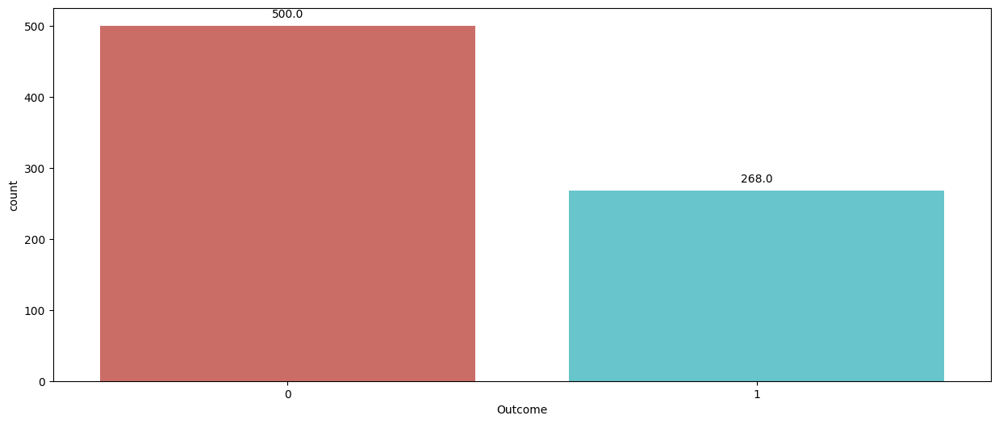

In [20]:
for i in discrete:
    plt.figure(figsize=(15, 6))
    ax = sns.countplot(x=i, data=df, palette='hls')
    for p in ax.patches:
        height = p.get_height()
        ax.annotate(f'{height}',
                    xy=(p.get_x() + p.get_width() / 2., height),
                    xytext=(0, 10),
                    textcoords='offset points',
                    ha='center', va='center')
    plt.show()

In [21]:
import plotly.express as px

for i in discrete:
    counts = df[i].value_counts()
    fig = px.pie(counts, values=counts.values, names=counts.index, title=f'Distribution of {i}')
    fig.show()


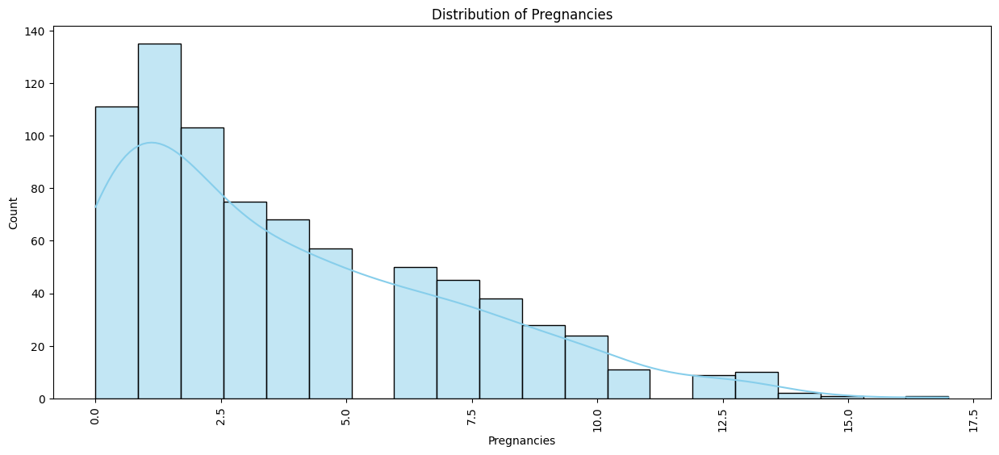

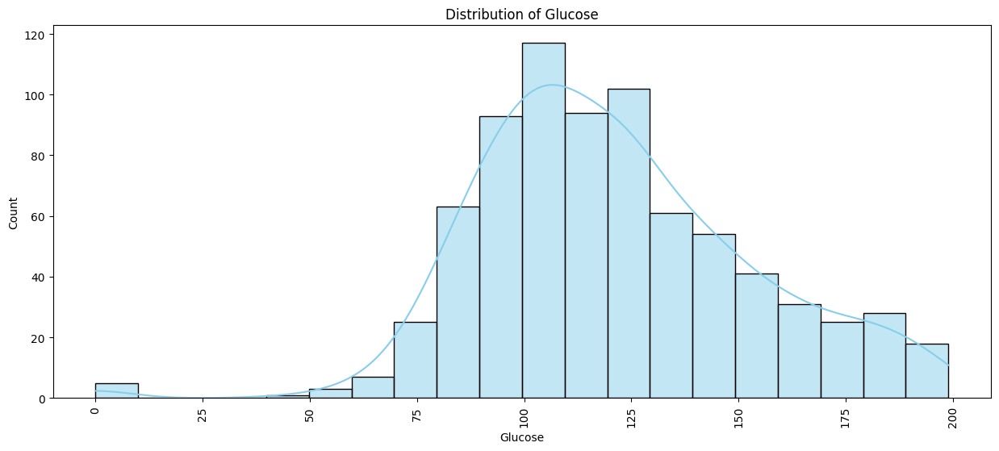

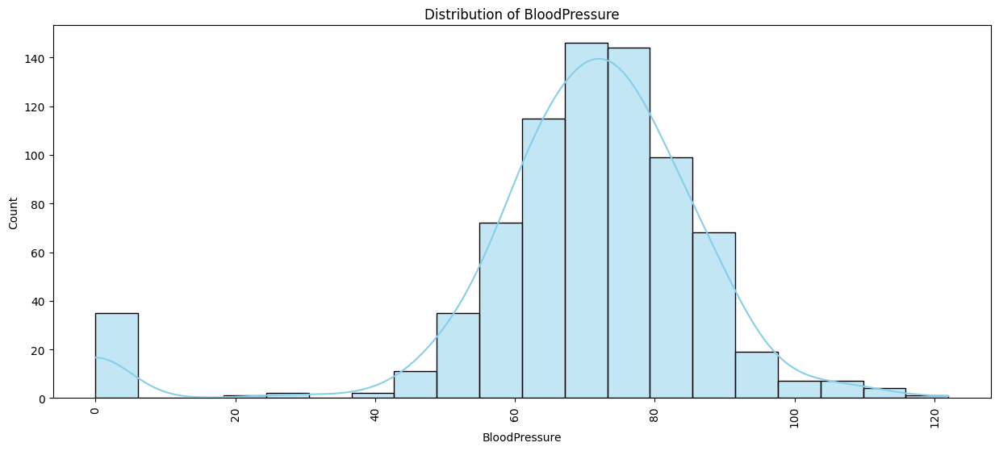

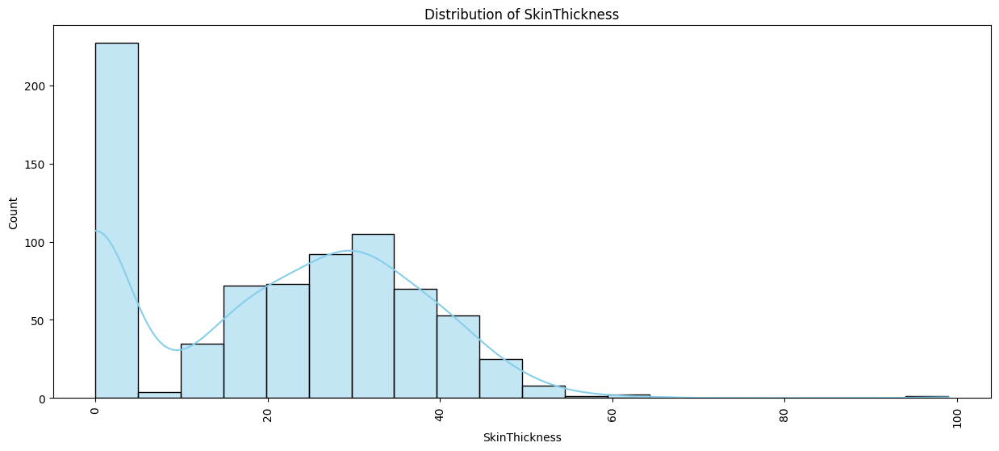

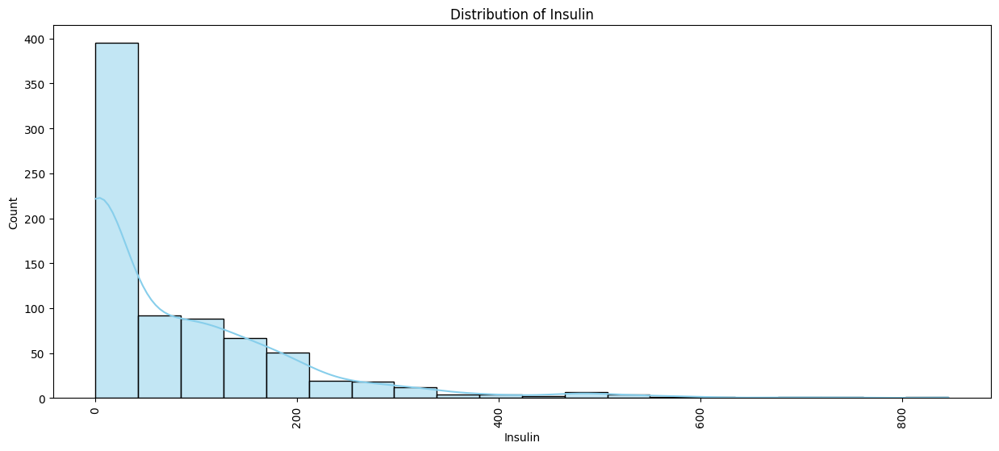

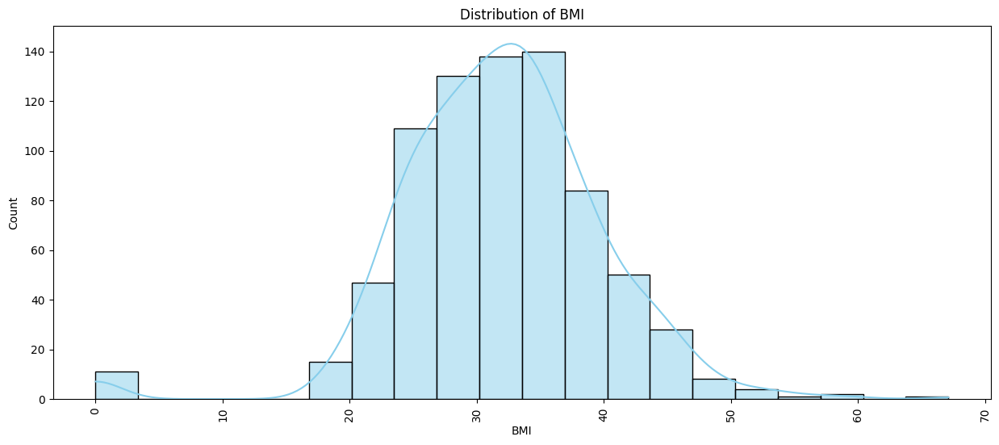

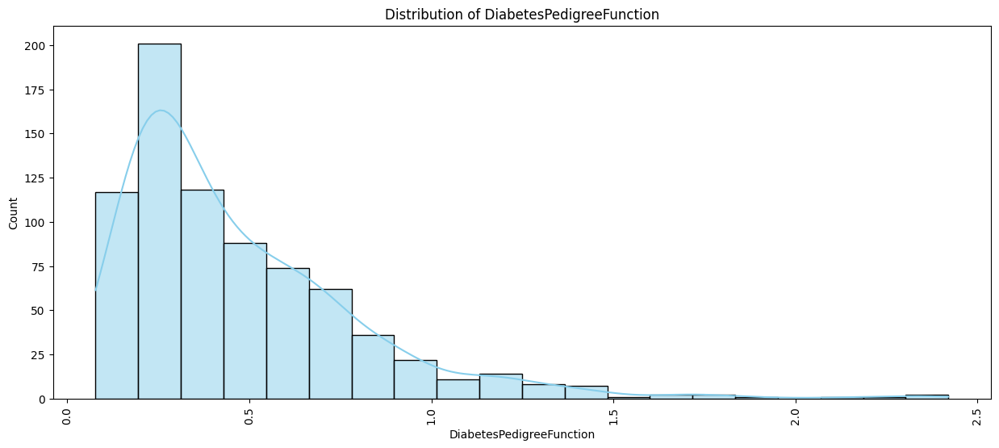

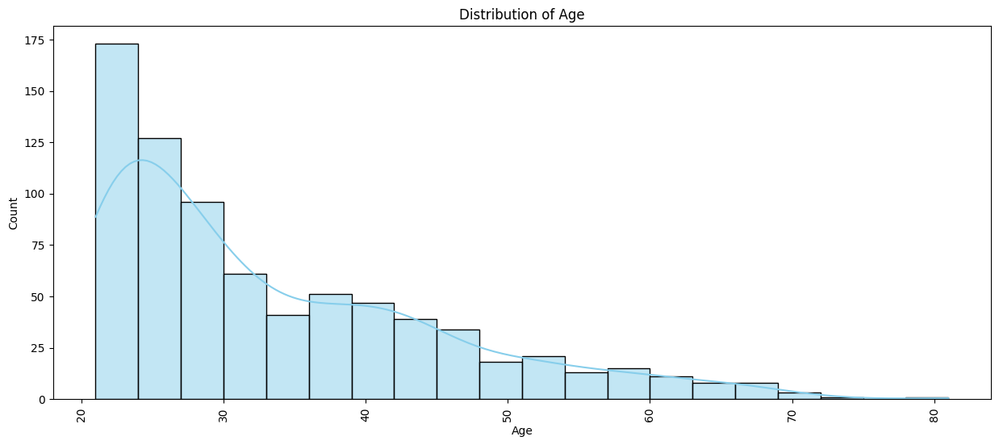

In [22]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.histplot(df[i], bins=20, kde=True, color='skyblue')
    plt.xticks(rotation=90)
    plt.title(f'Distribution of {i}')
    plt.show()

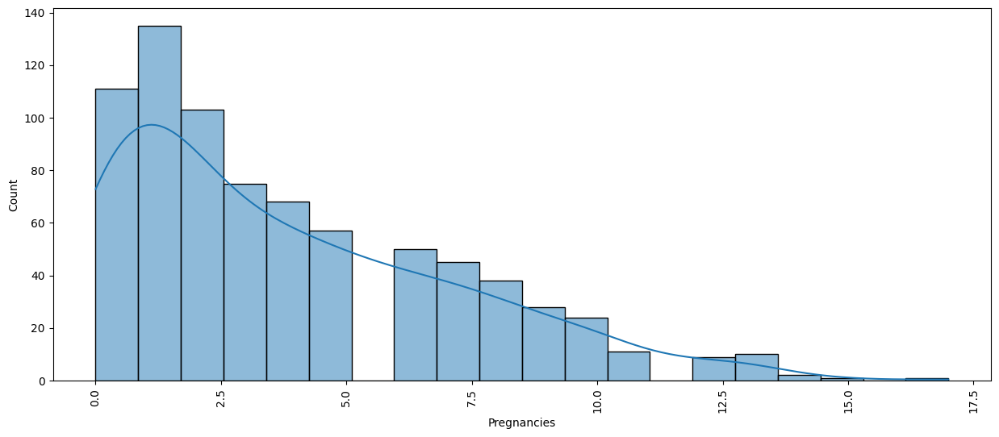

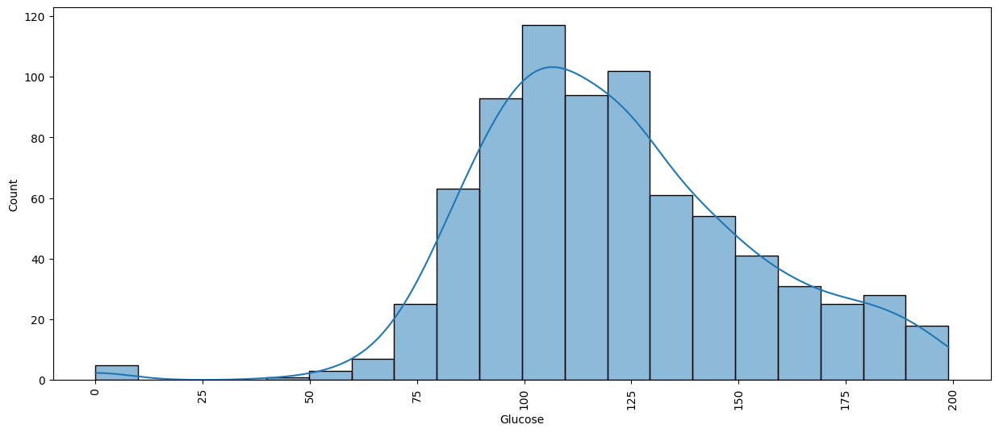

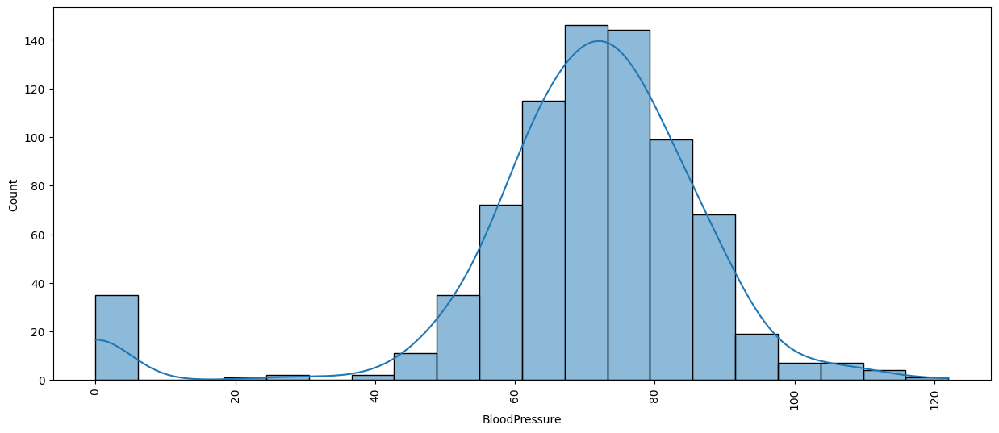

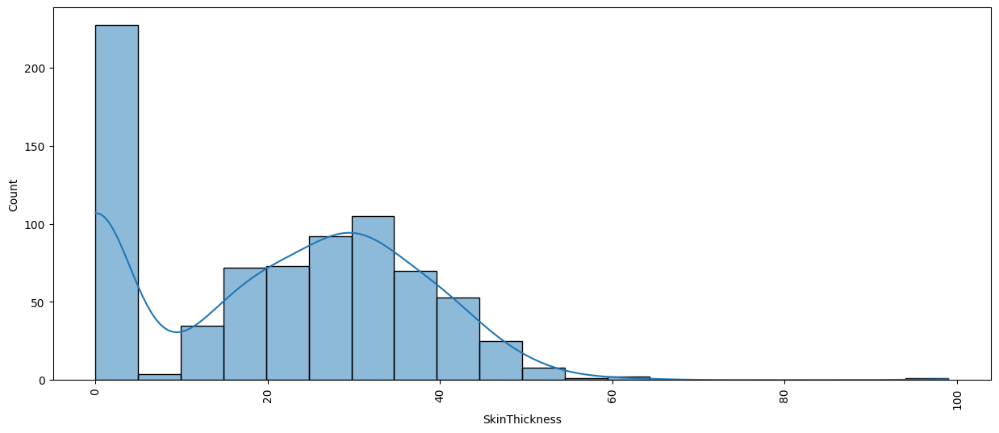

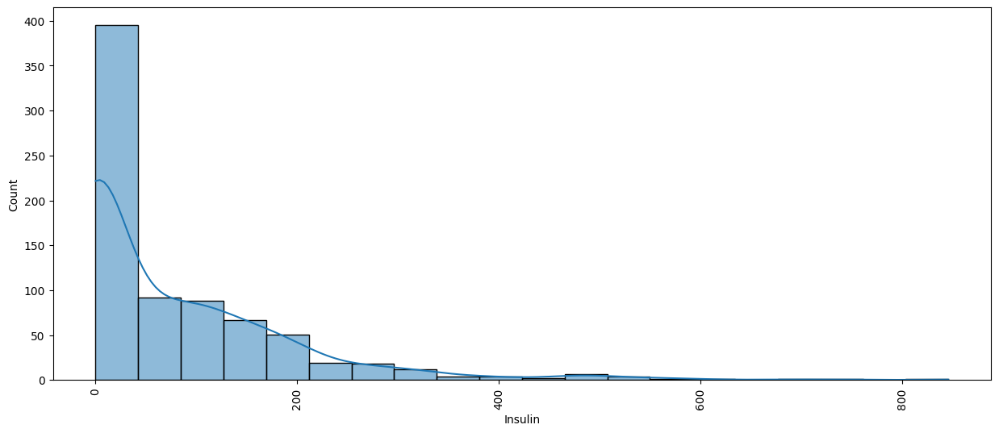

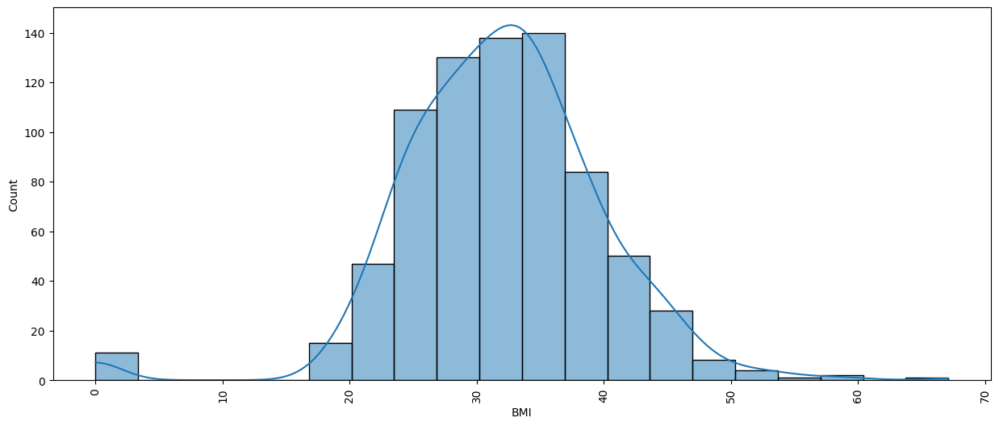

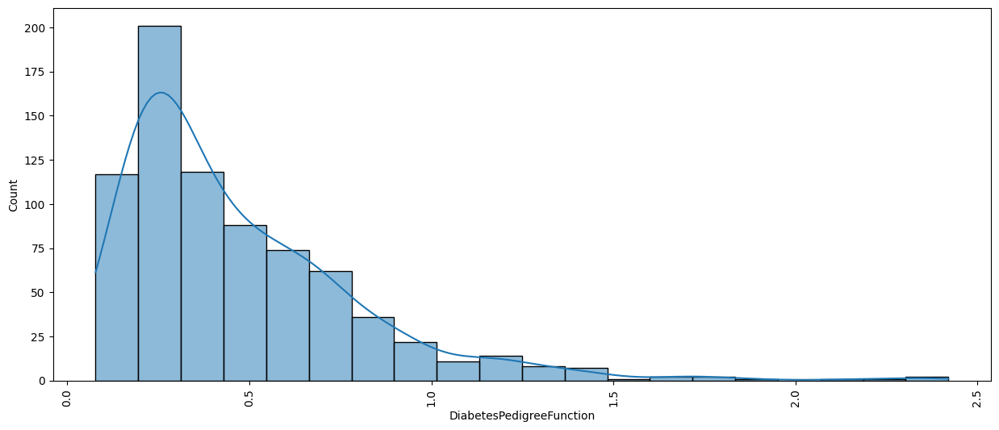

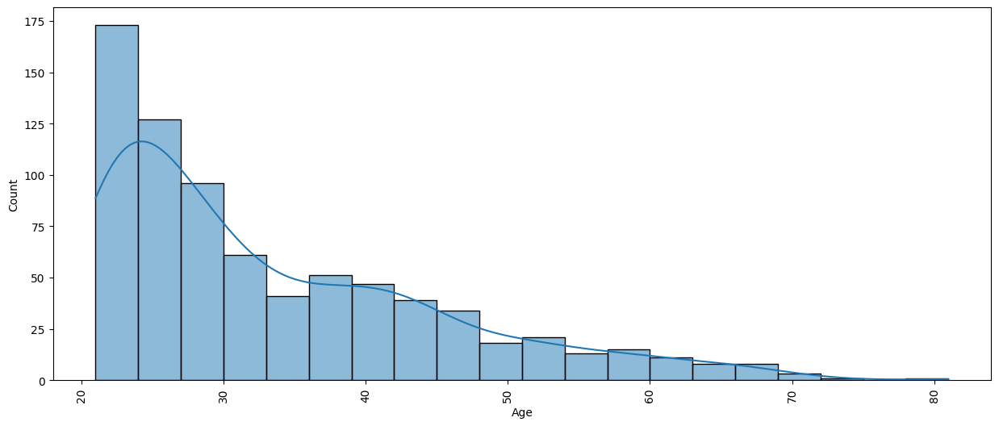

In [23]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.histplot(df[i], bins=20, kde=True)
    plt.xticks(rotation=90)
    plt.show()


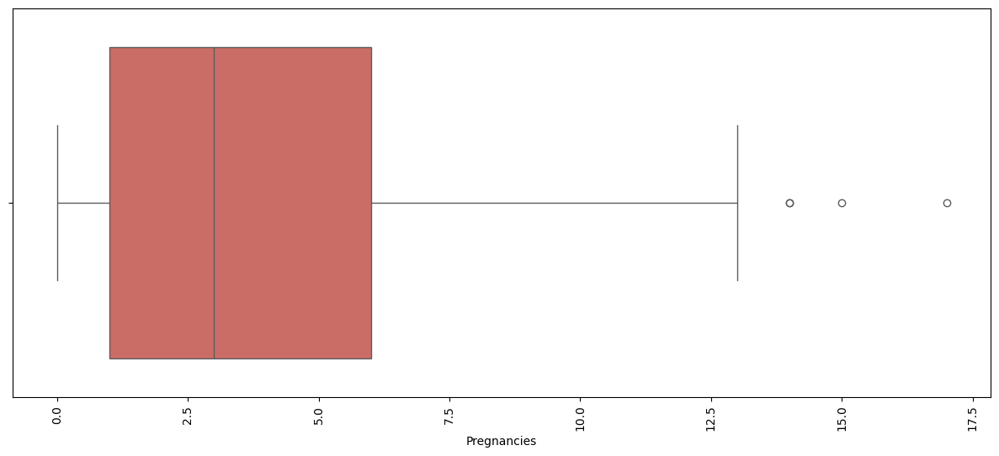

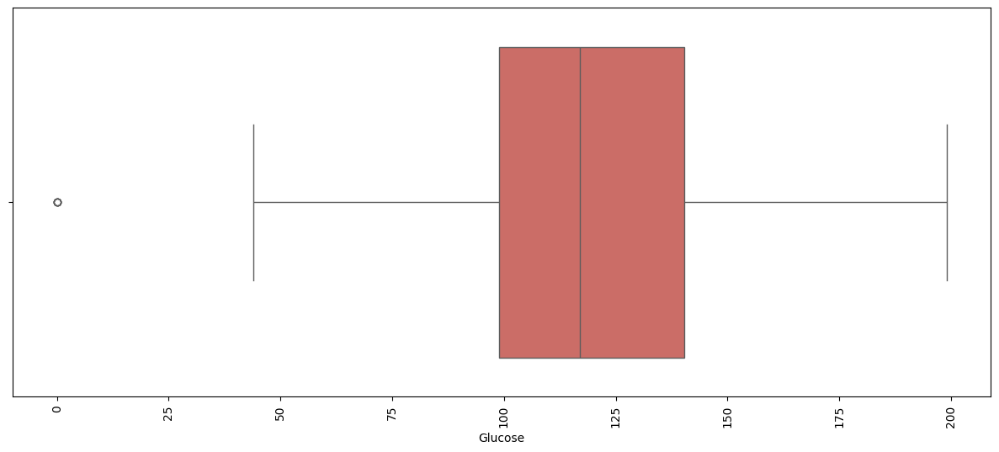

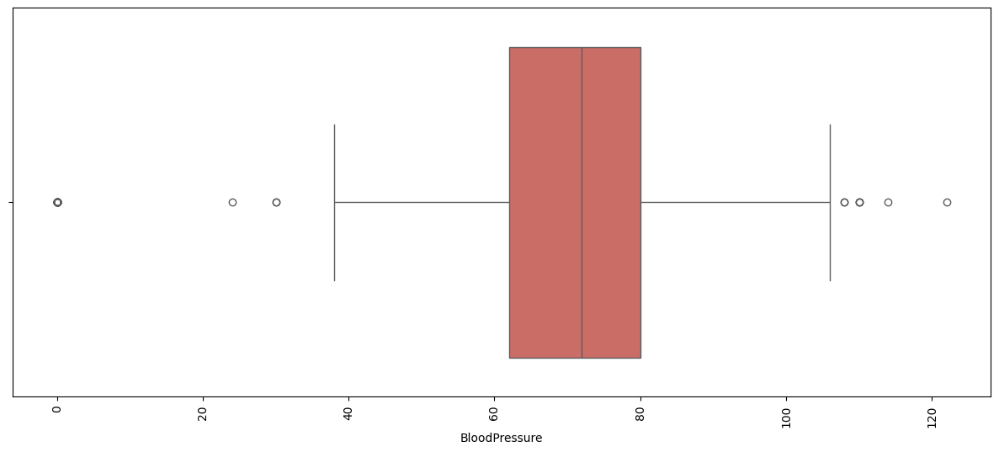

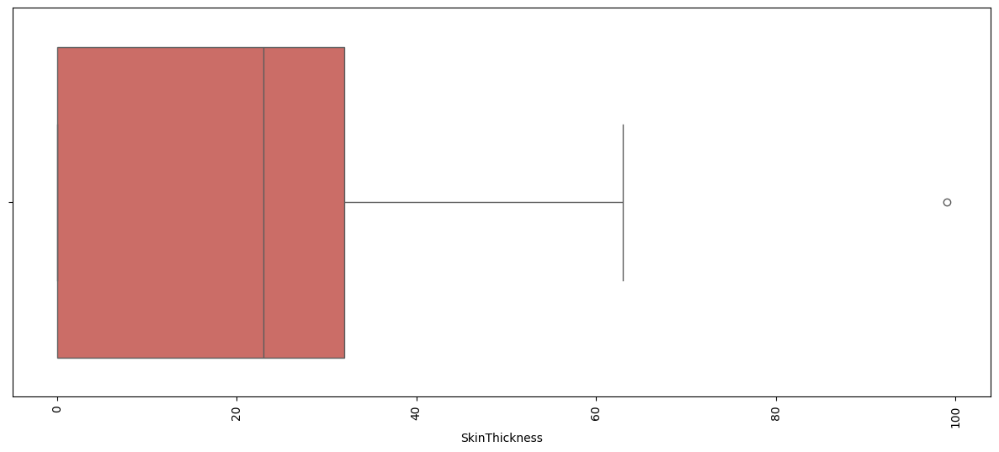

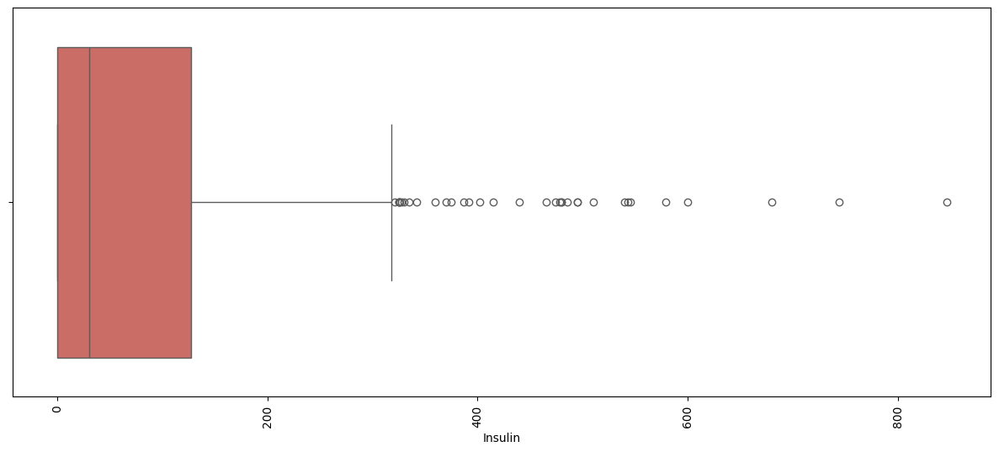

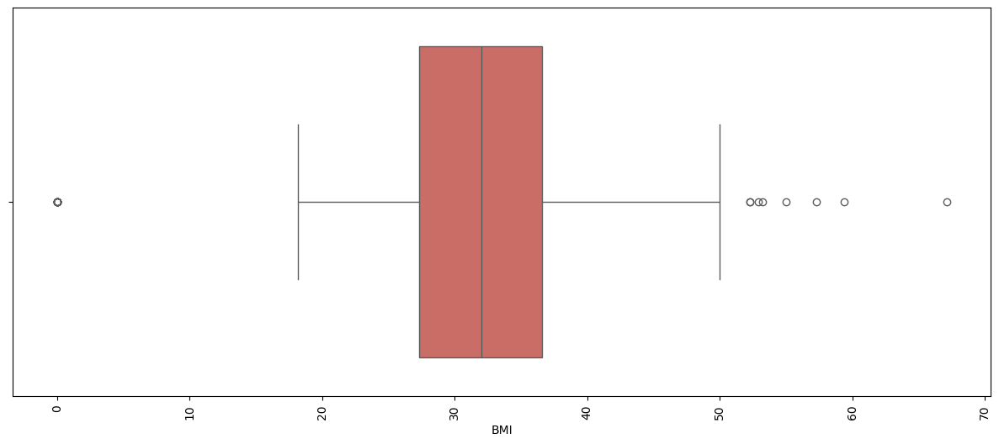

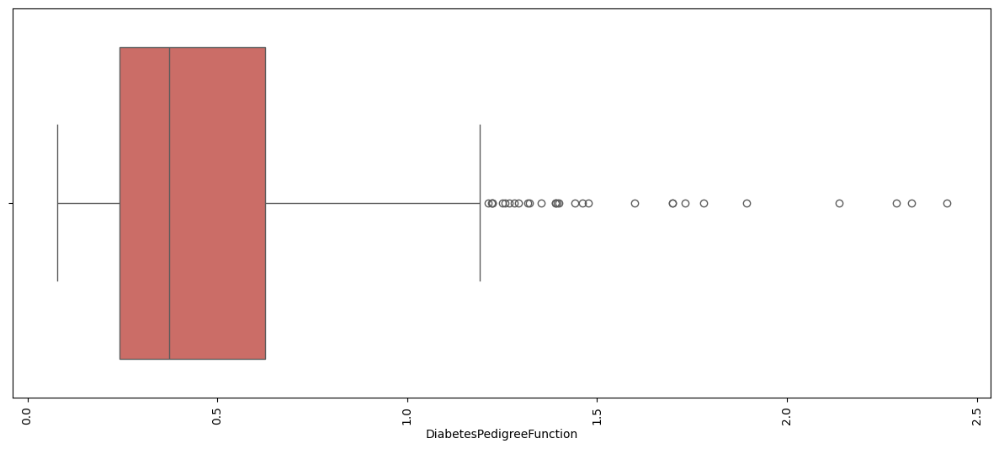

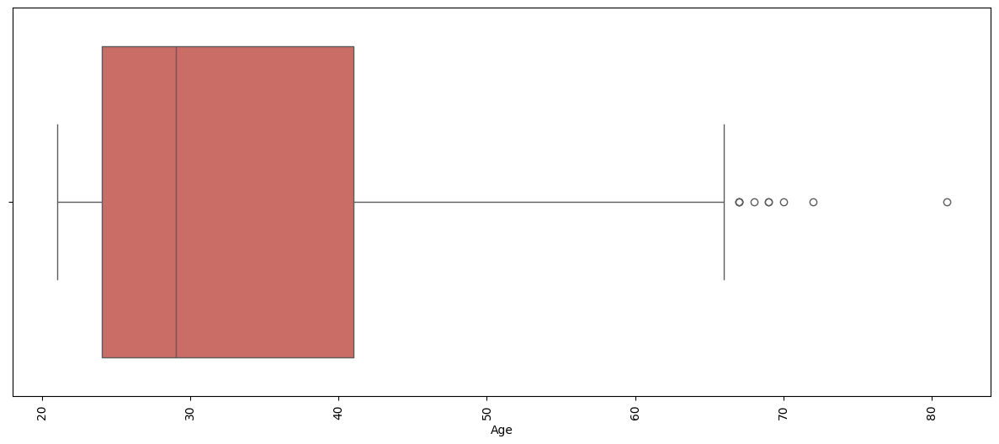

In [24]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()


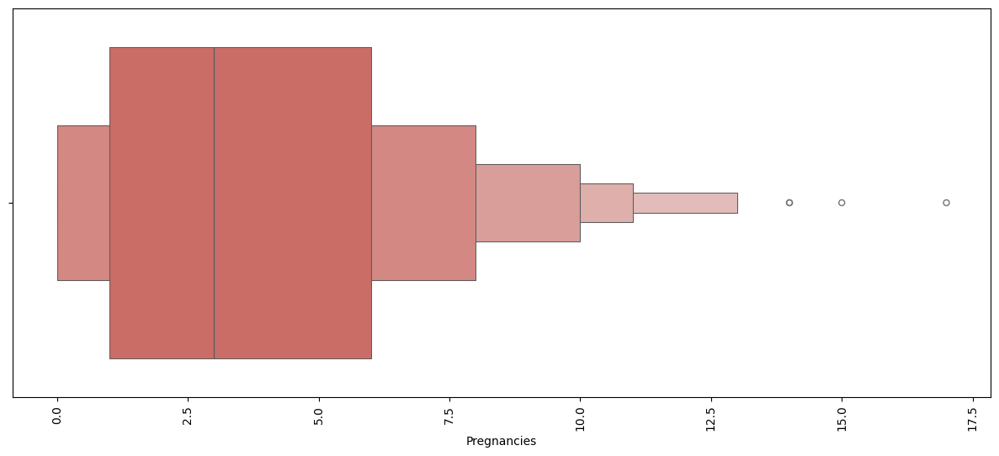

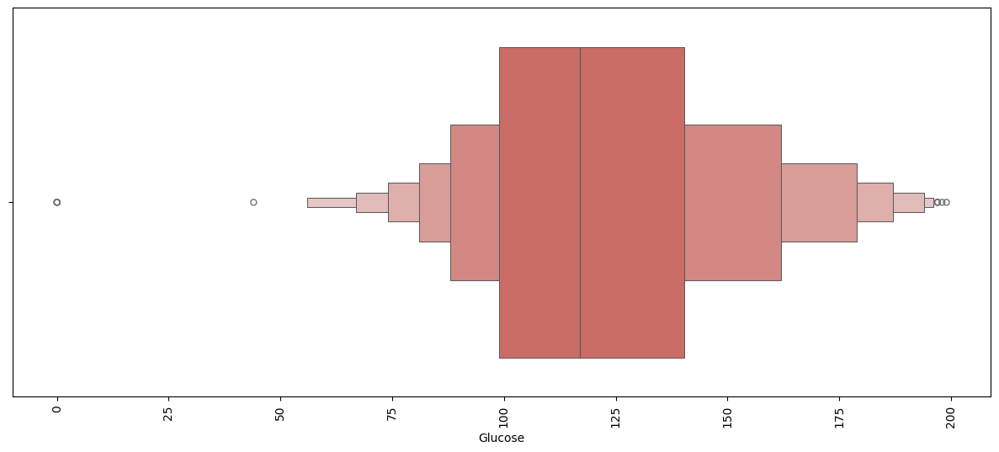

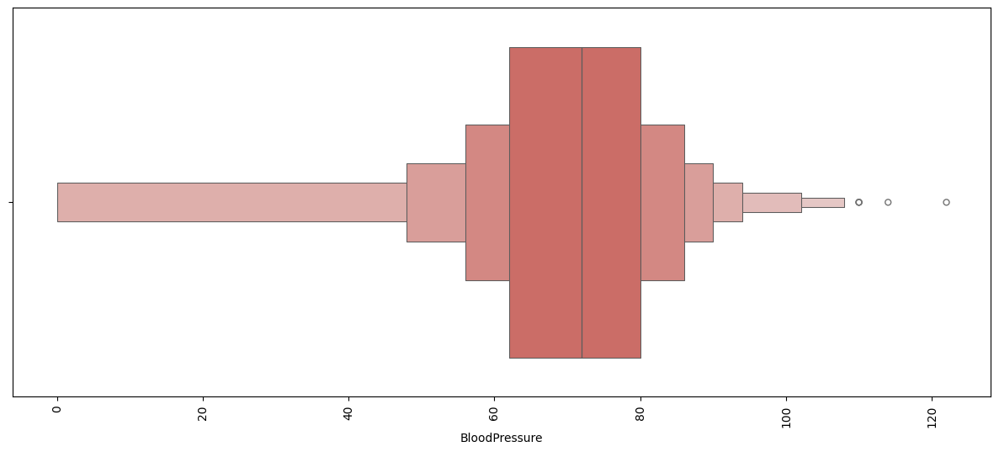

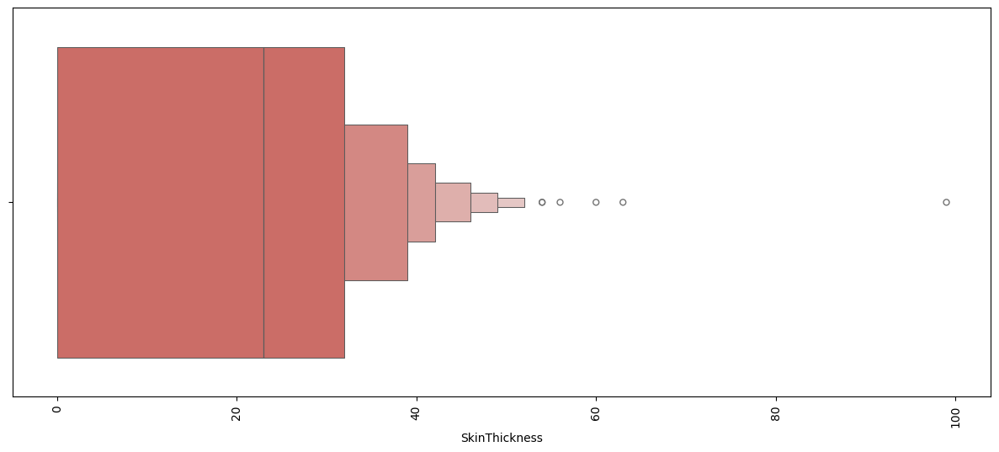

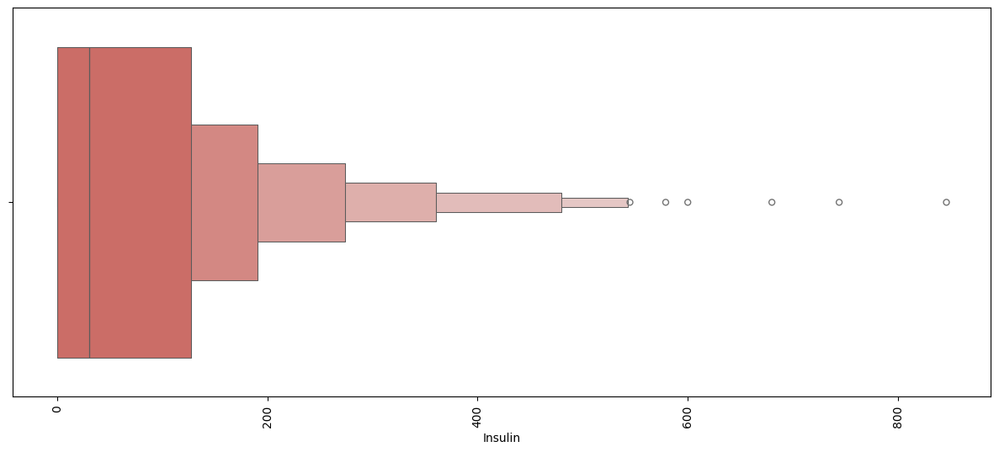

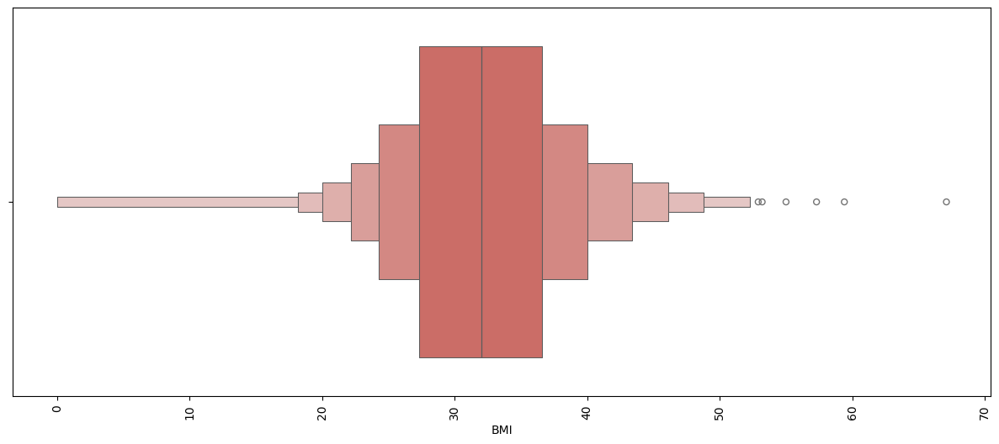

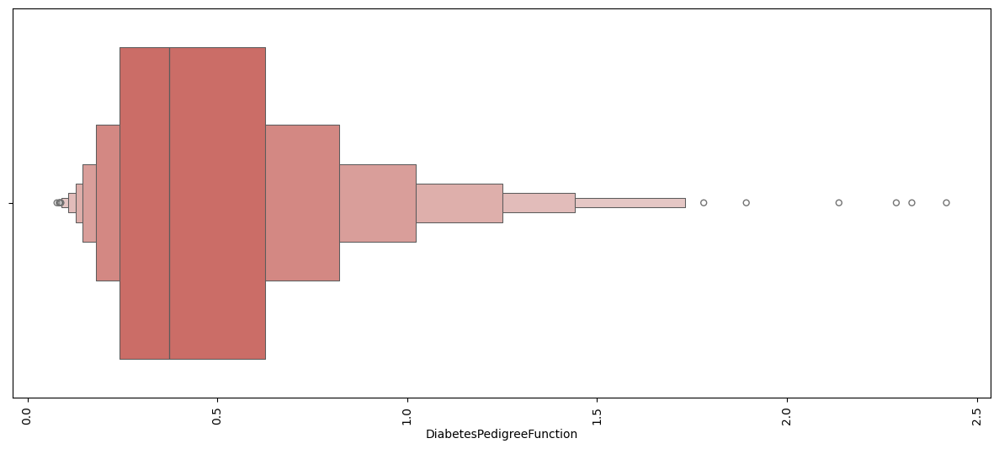

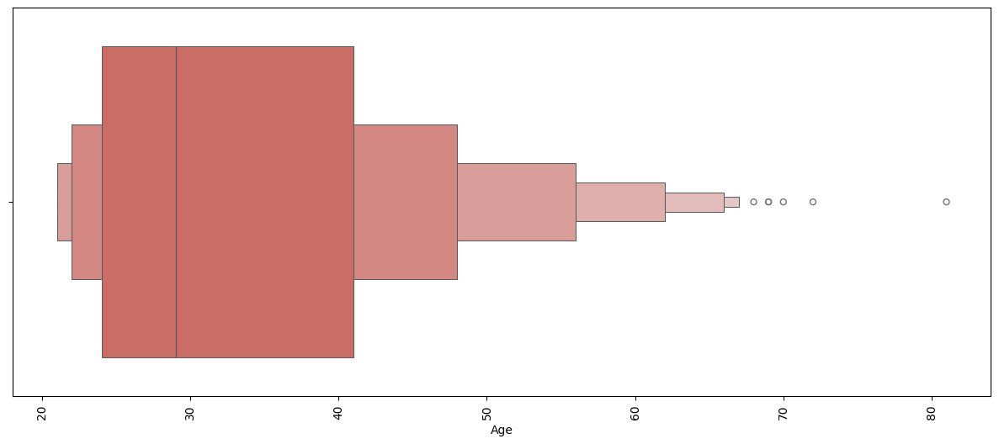

In [25]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxenplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()


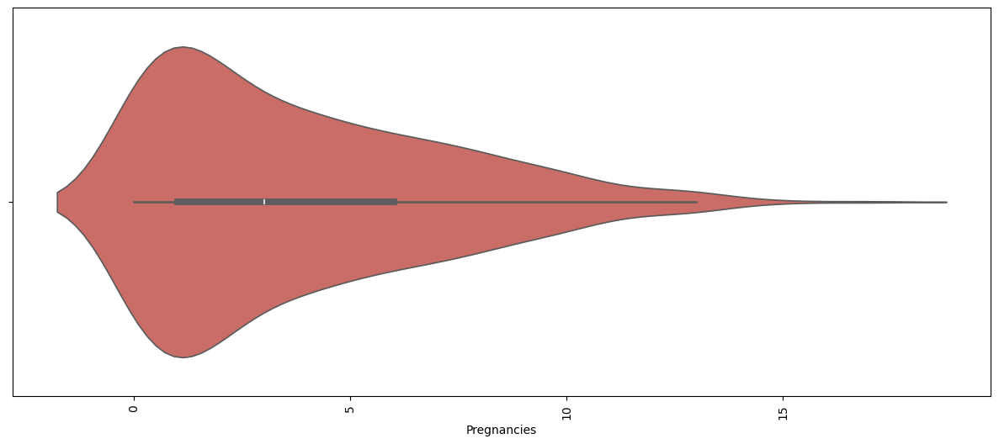

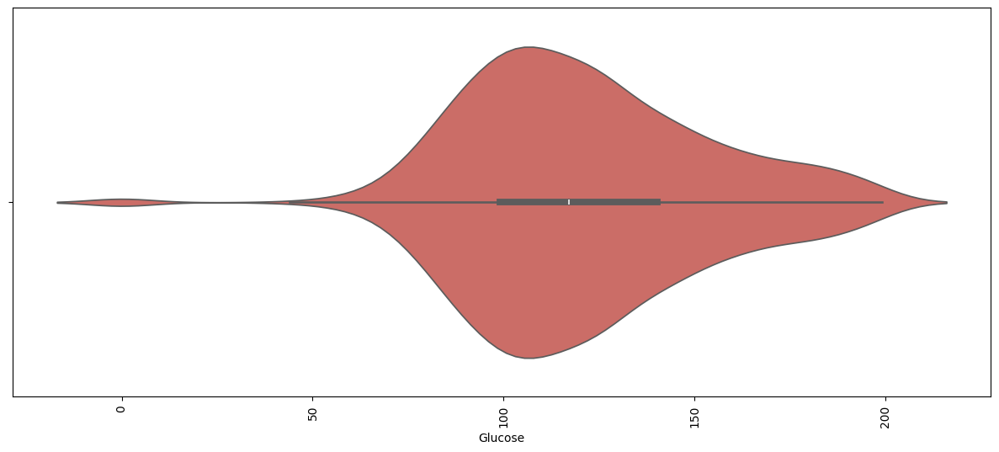

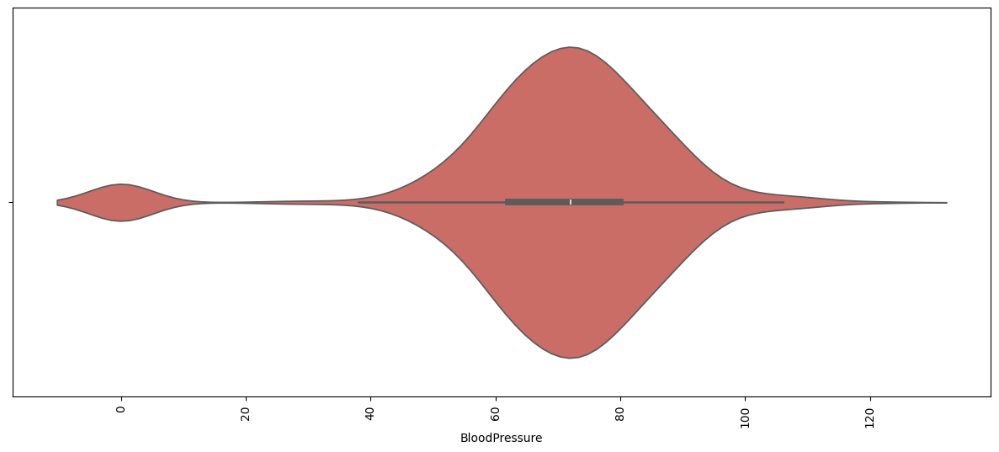

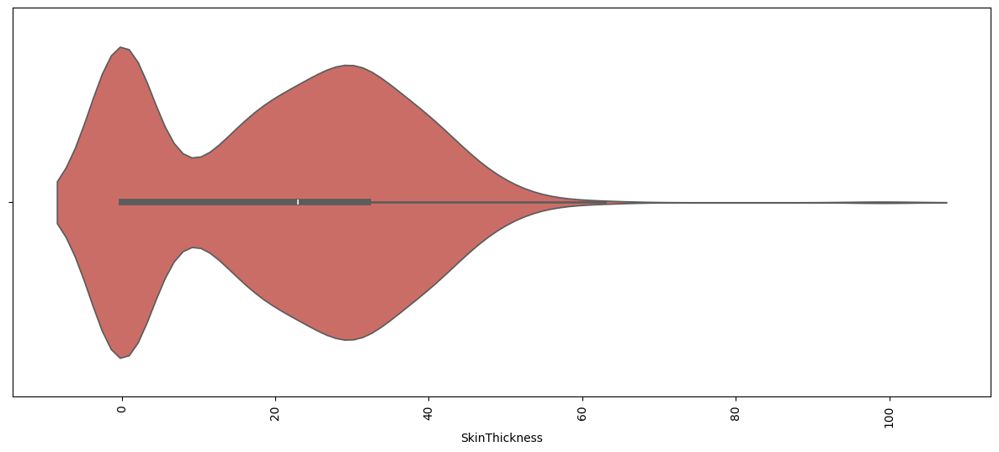

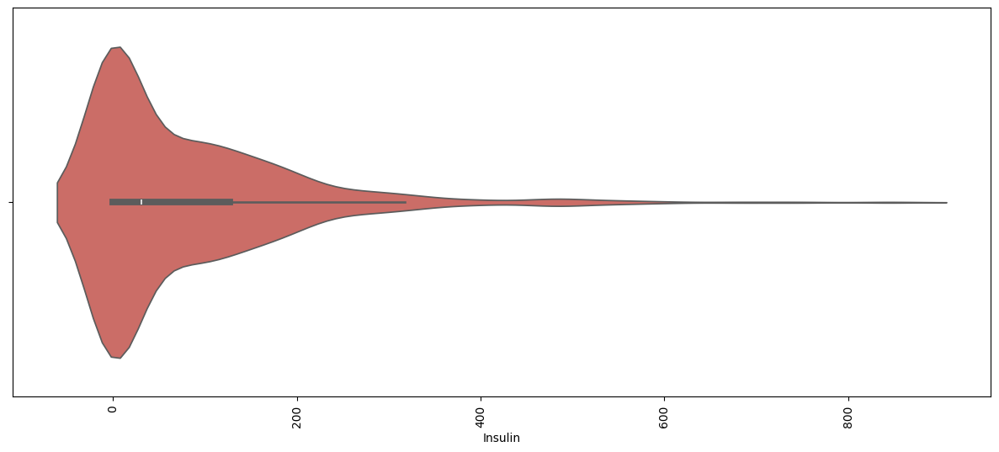

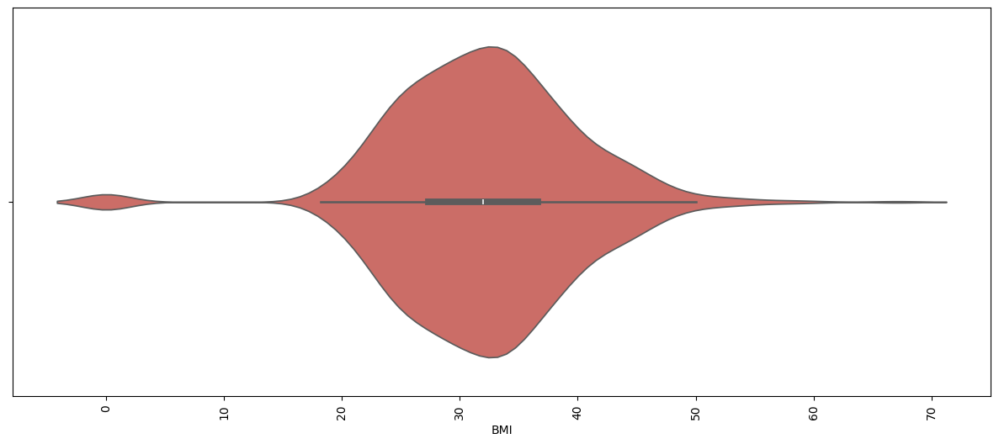

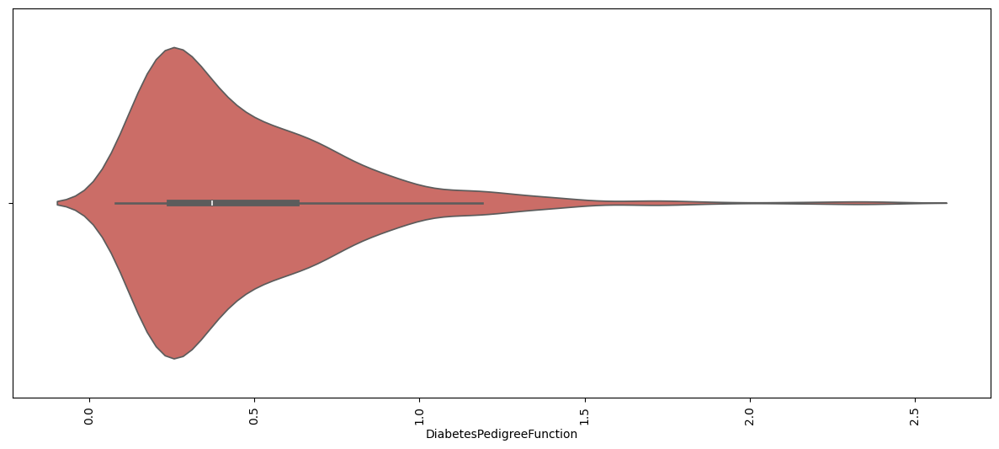

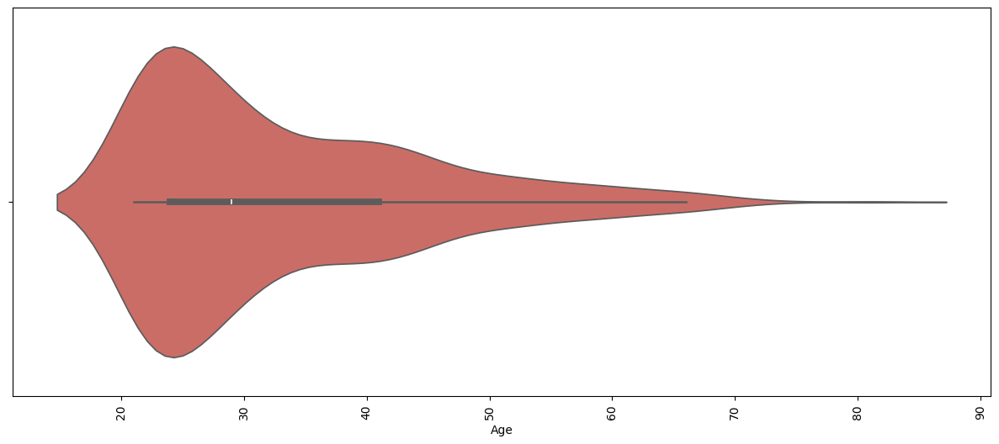

In [26]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.violinplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()


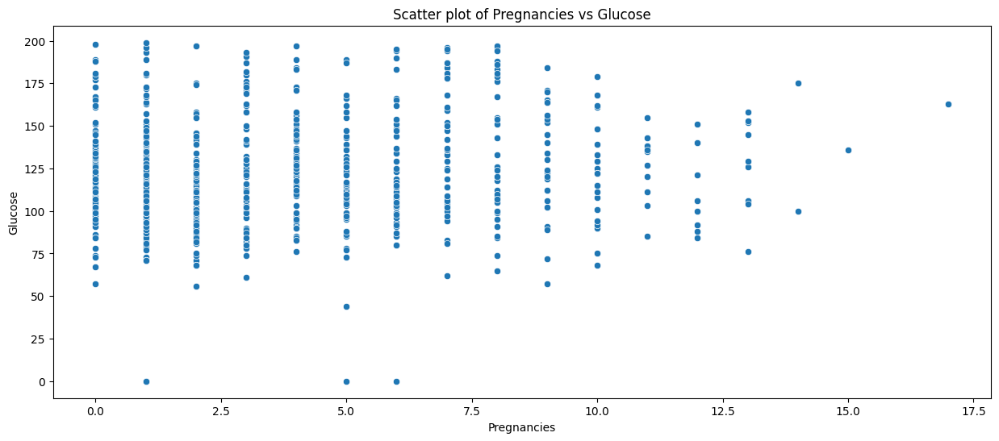

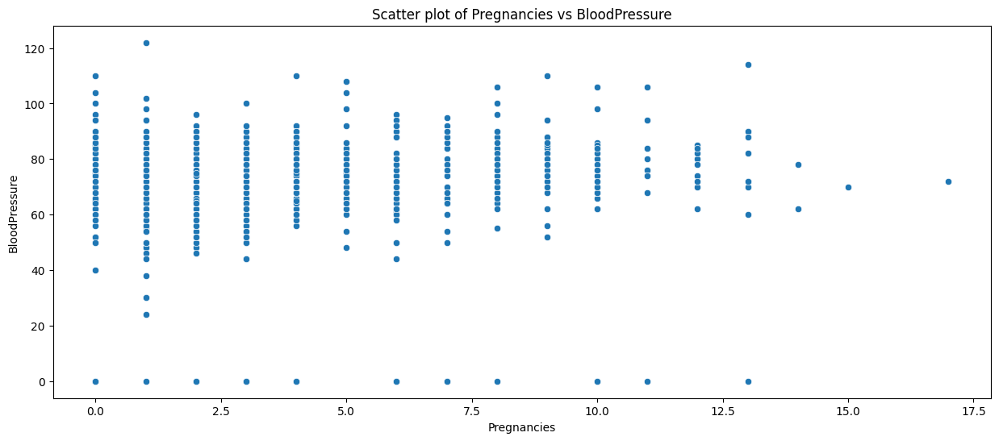

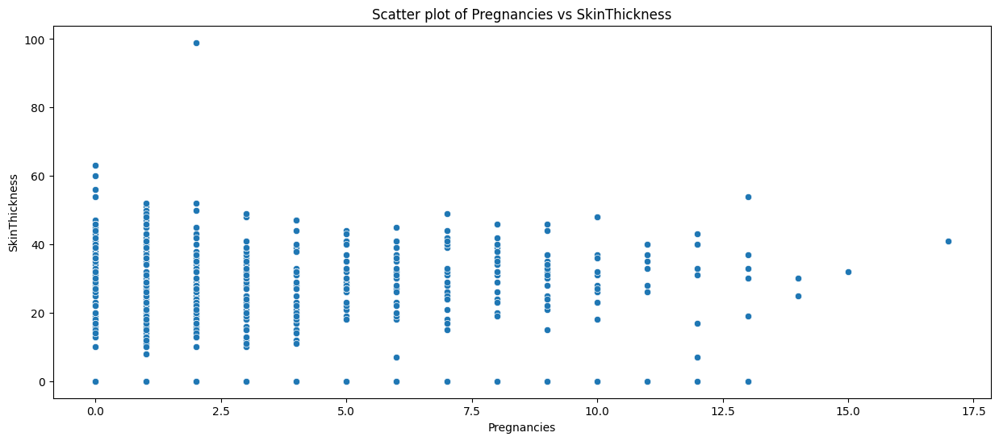

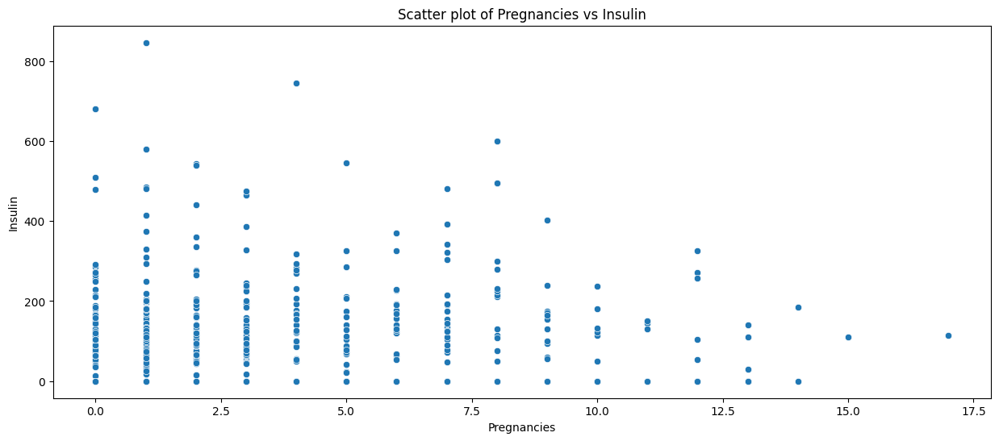

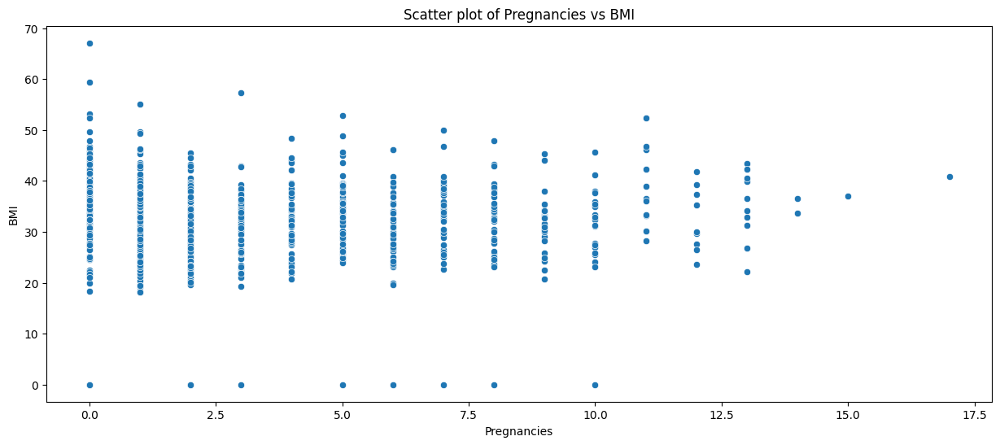

...

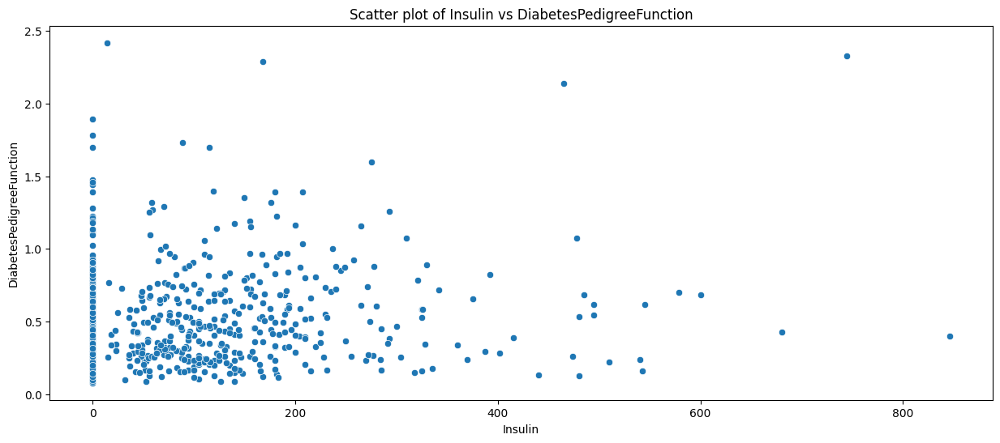

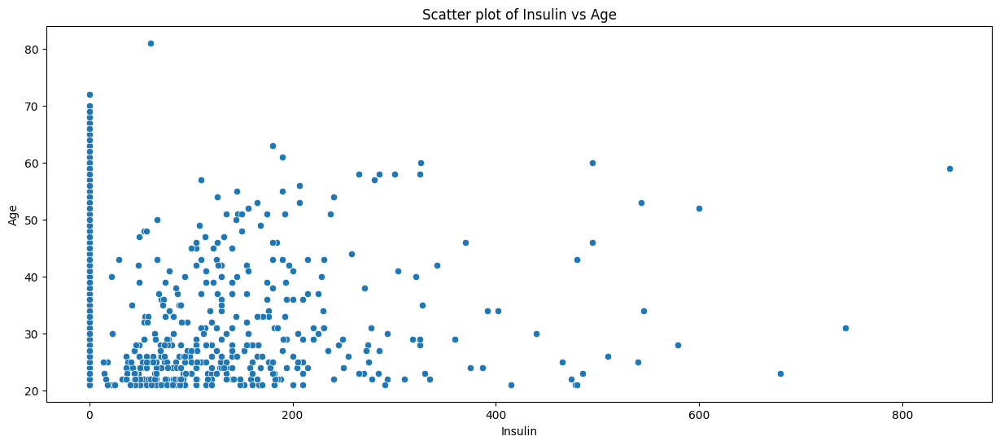

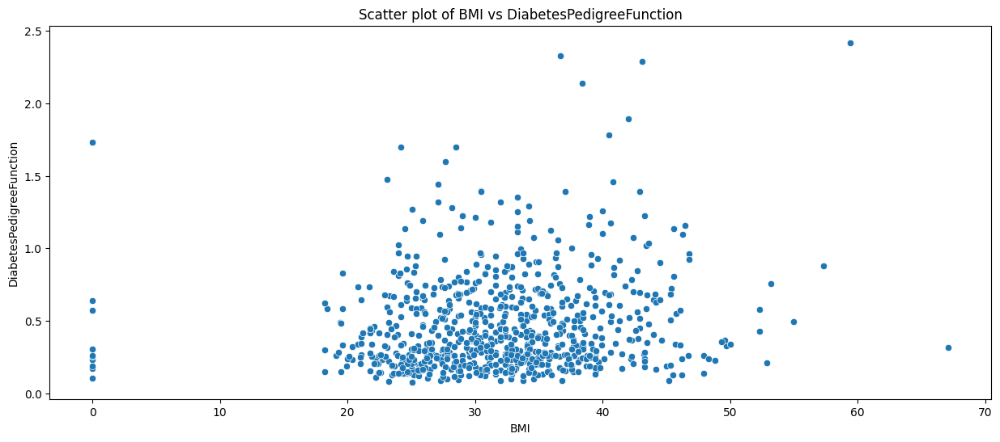

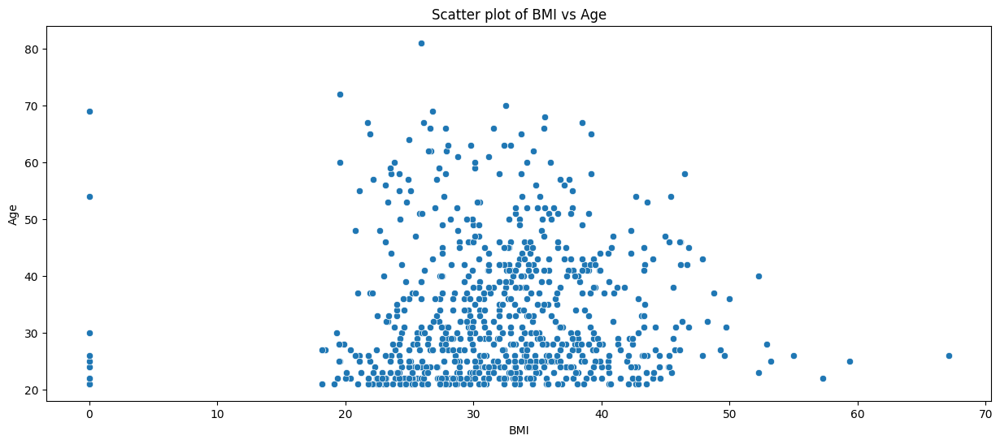

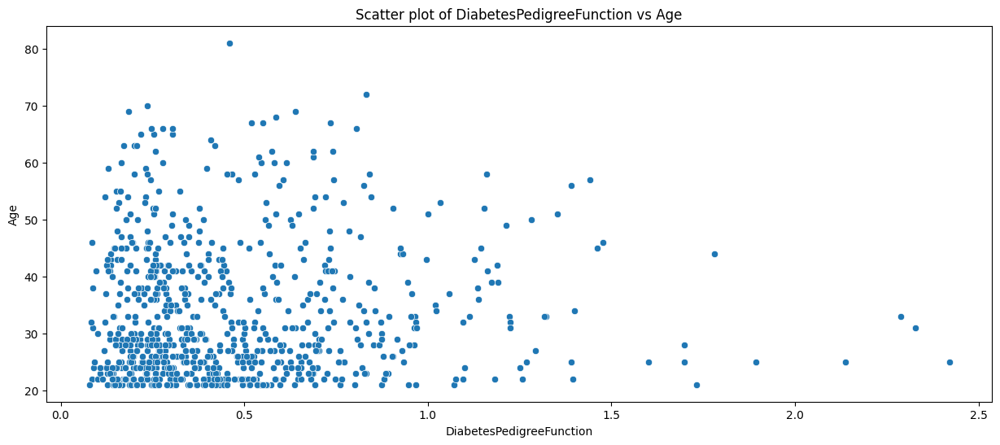

In [27]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.scatterplot(x=continuous[i], y=continuous[j], data=df, palette='hls')
        plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
        plt.show()


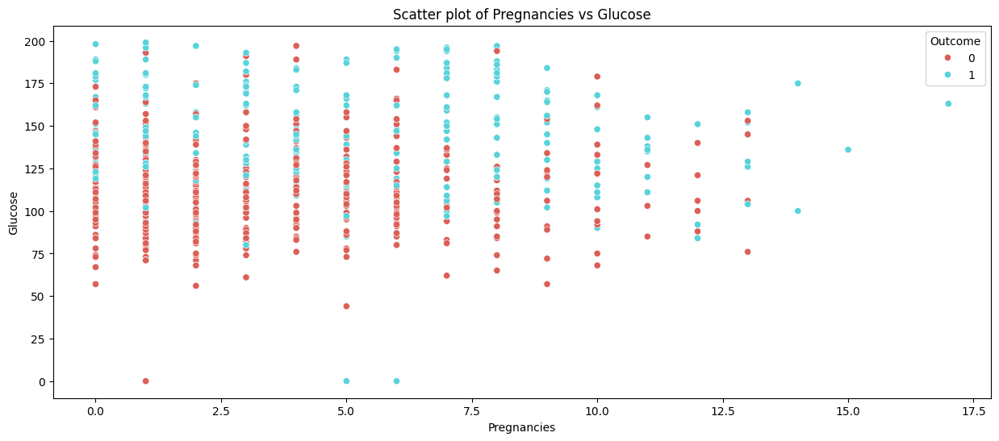

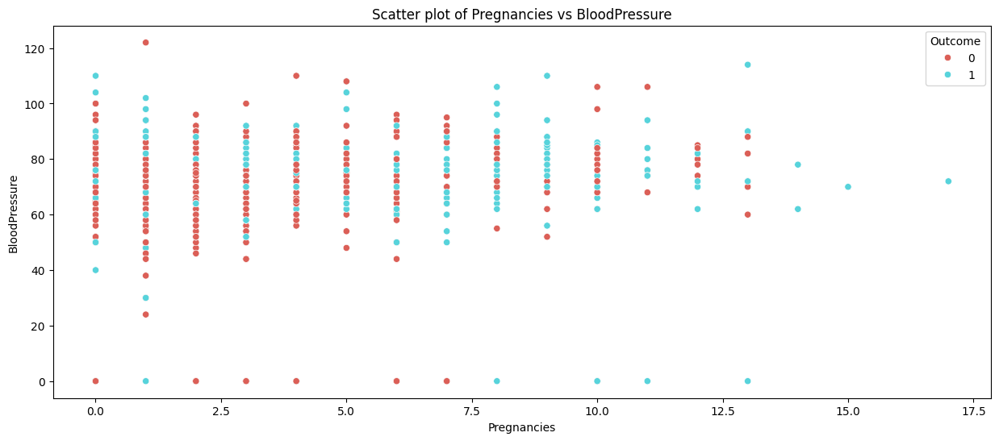

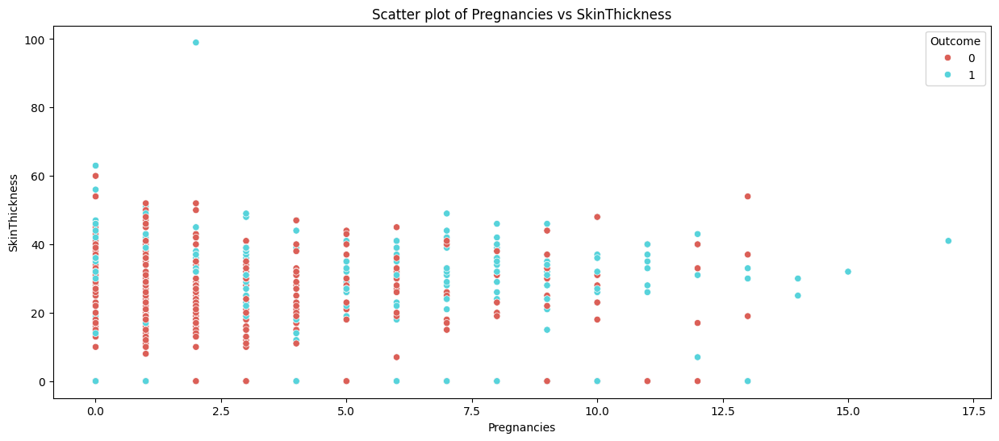

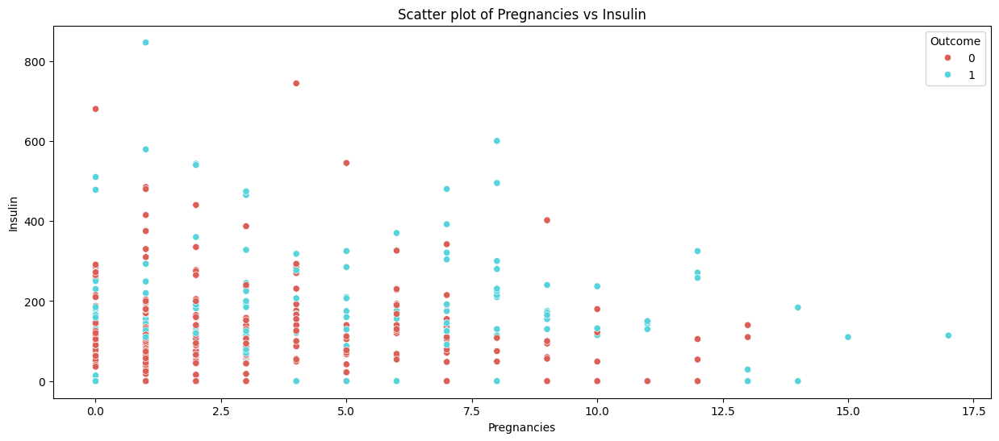

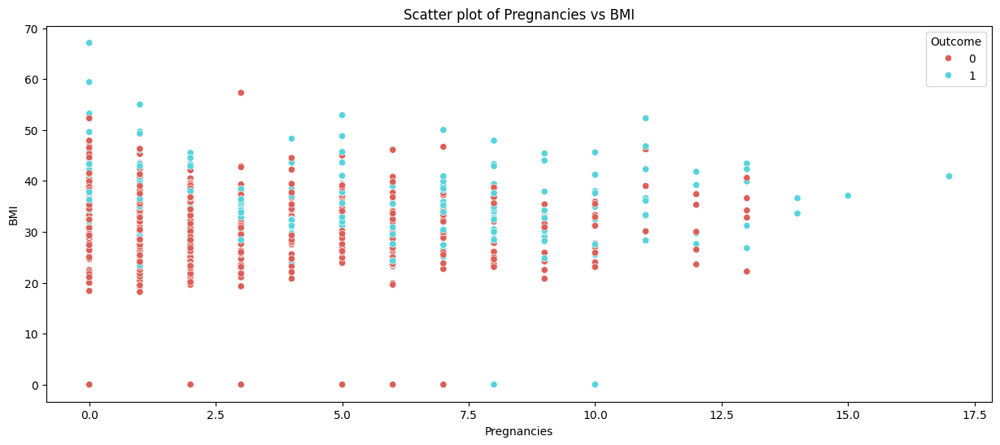

...

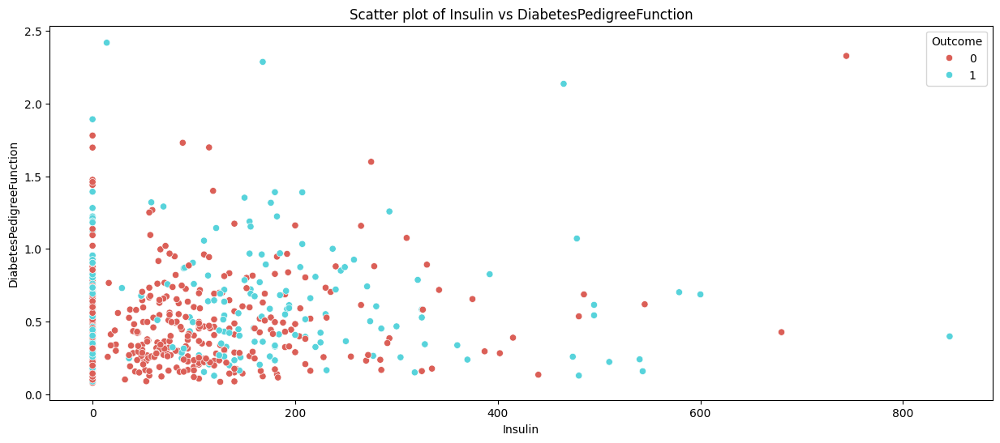

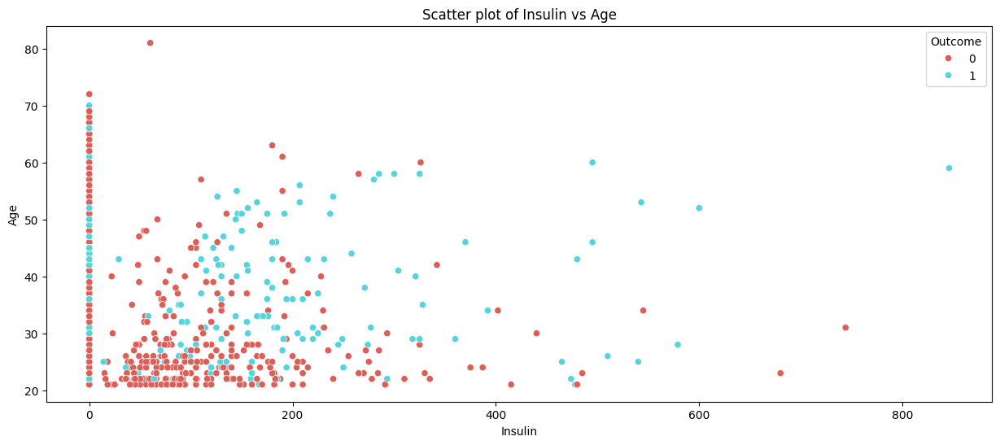

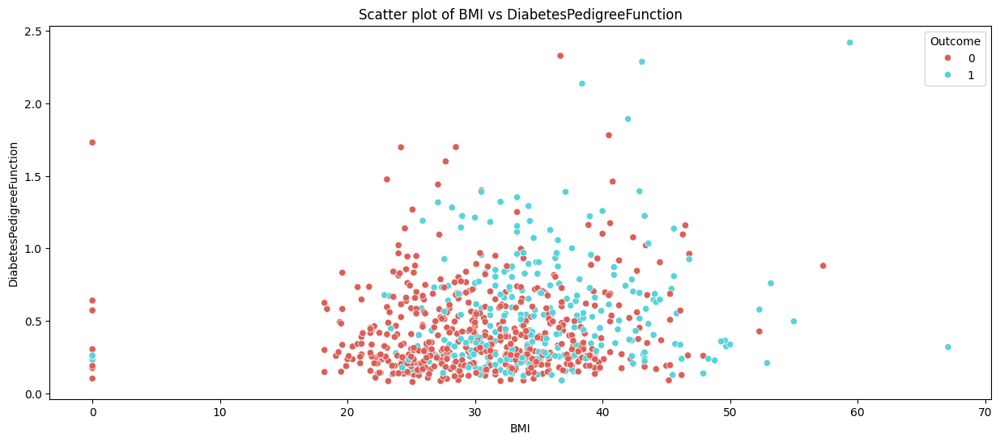

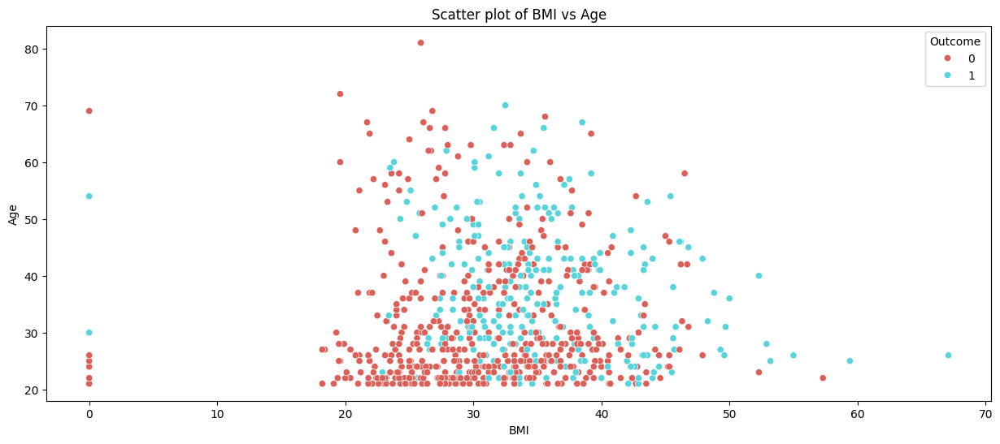

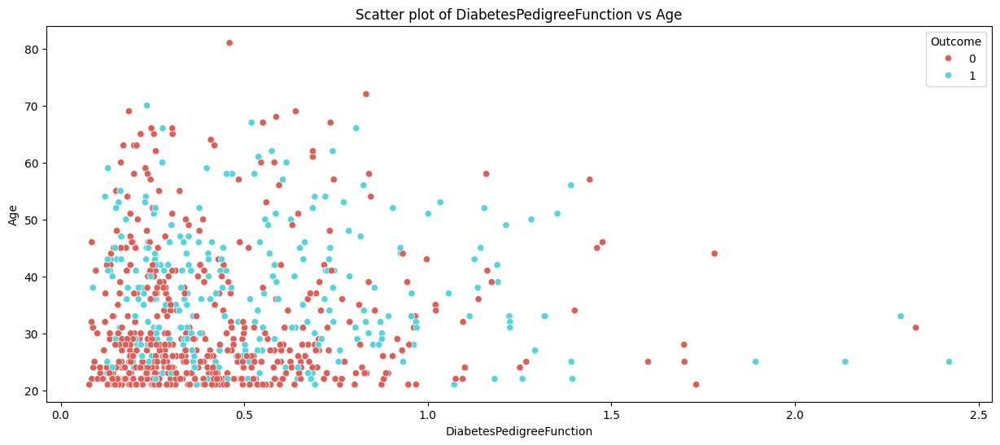

In [28]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.scatterplot(x=continuous[i], y=continuous[j], data=df, hue='Outcome', palette='hls')
        plt.title(f'Scatter plot of {continuous[i]} vs {continuous[j]}')
        plt.show()


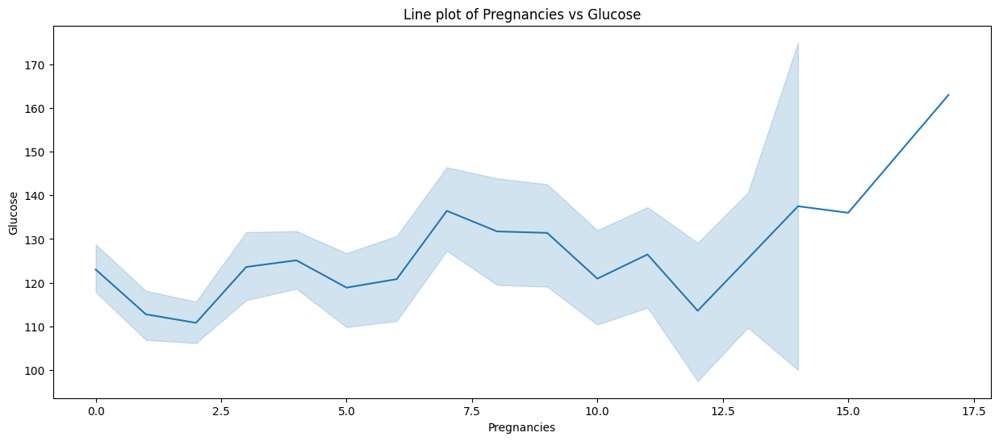

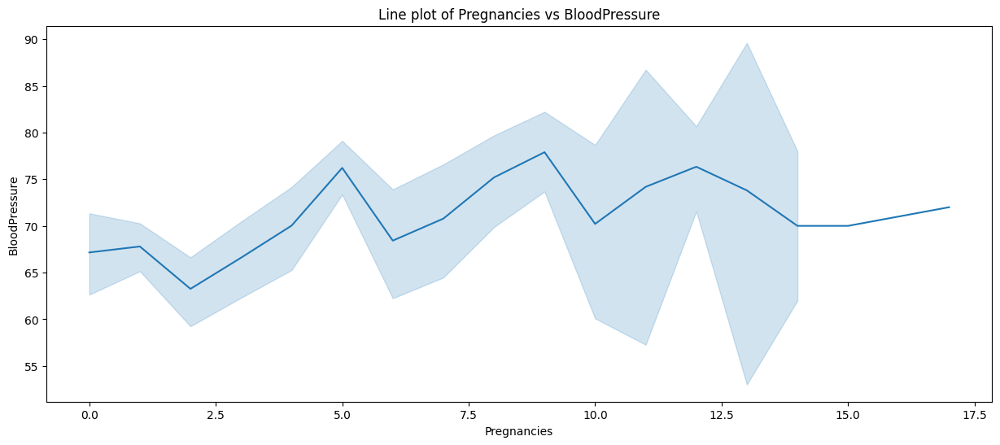

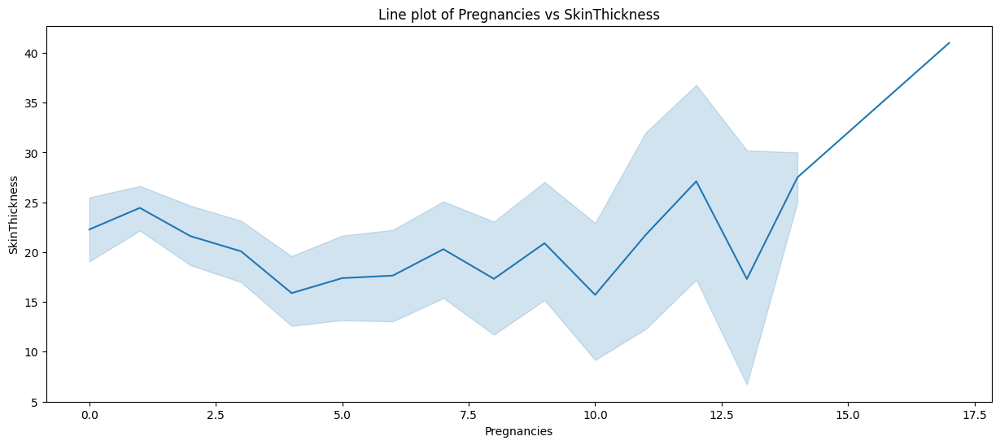

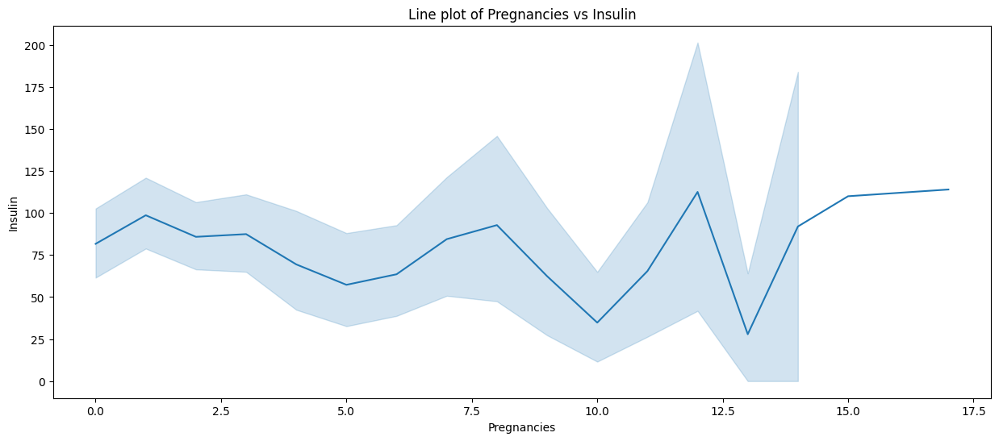

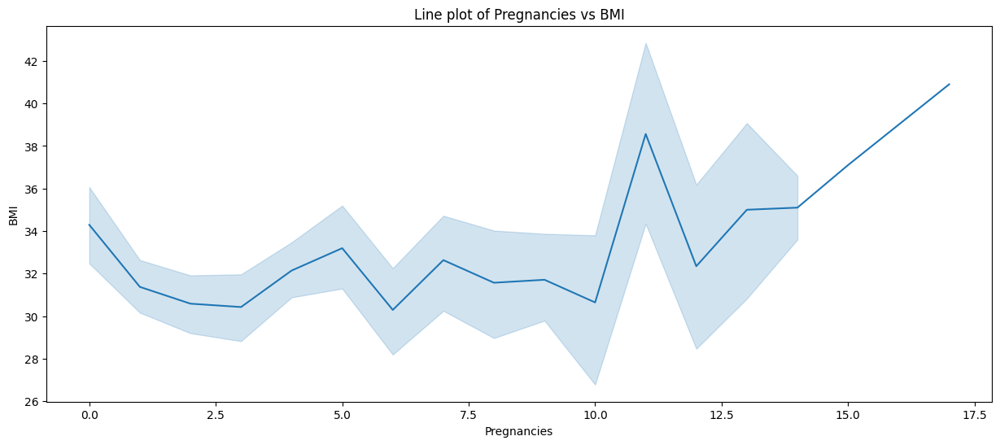

...

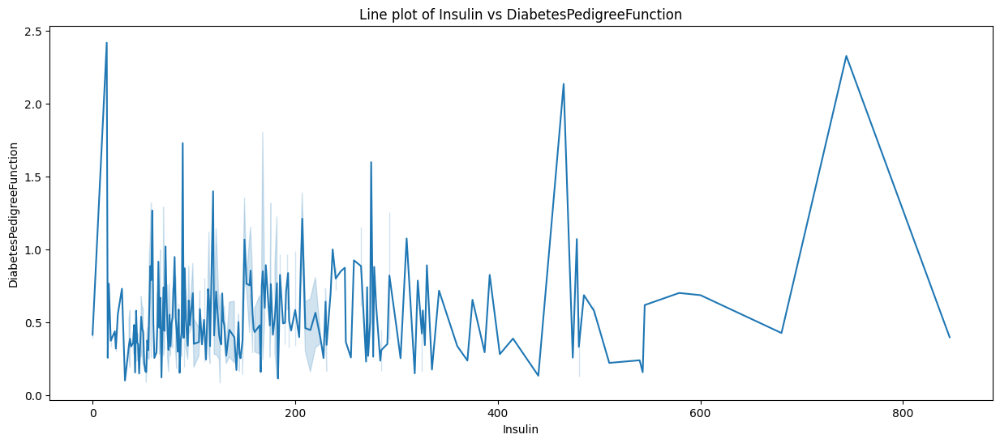

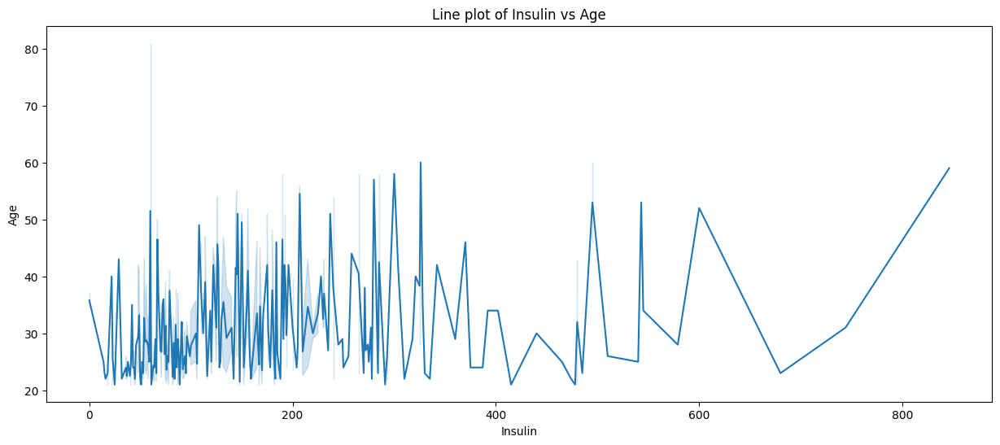

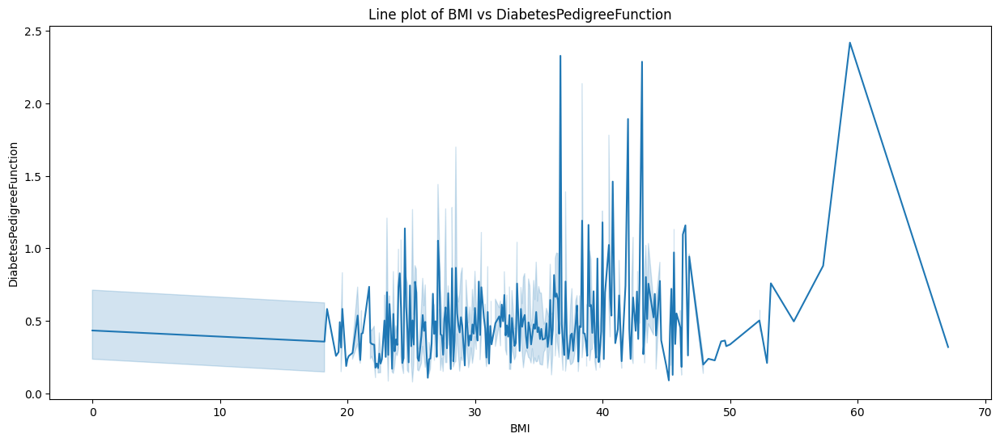

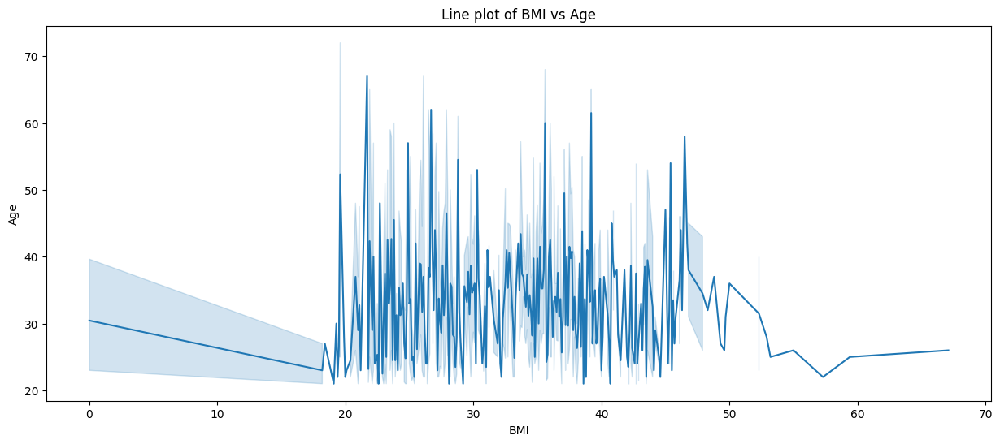

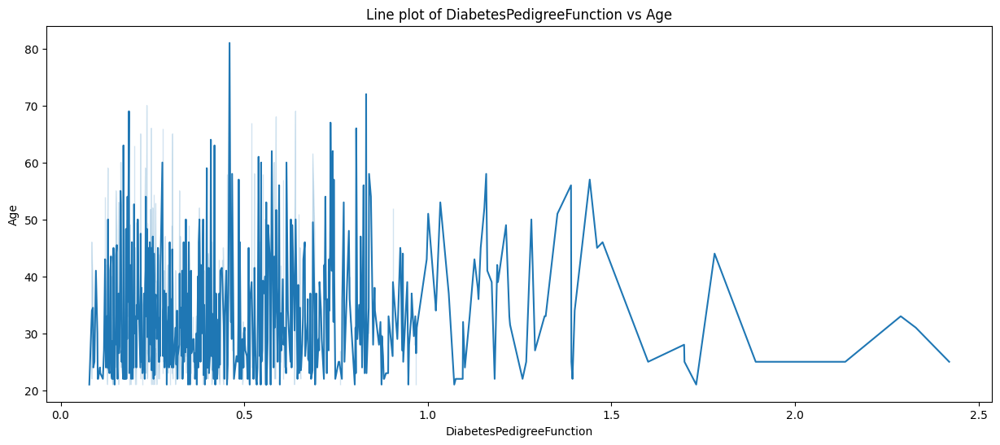

In [29]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.lineplot(x=continuous[i], y=continuous[j], data=df, palette='hls')
        plt.title(f'Line plot of {continuous[i]} vs {continuous[j]}')
        plt.show()


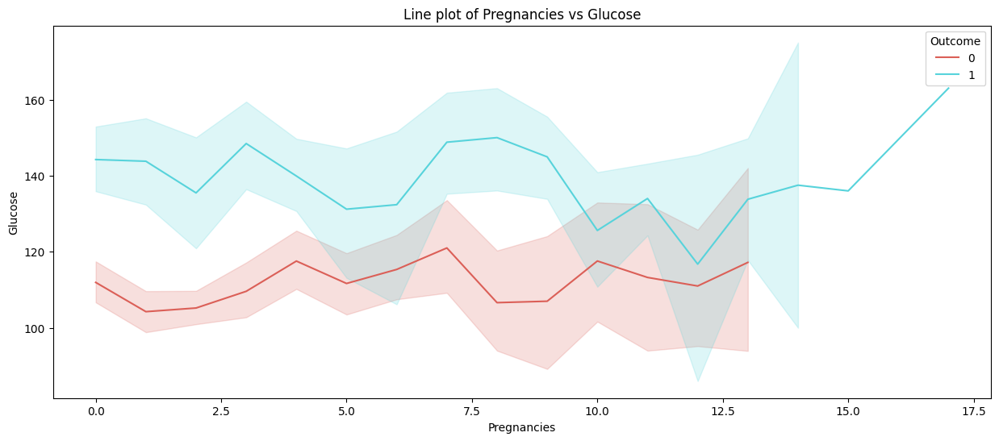

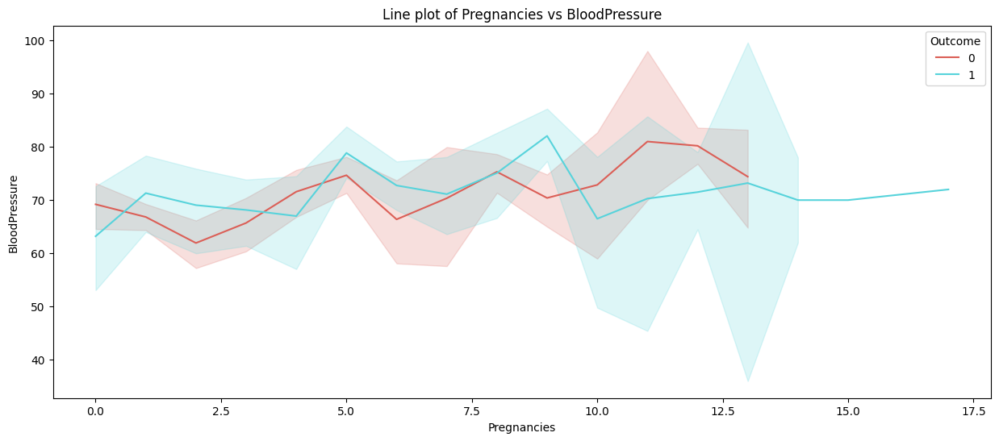

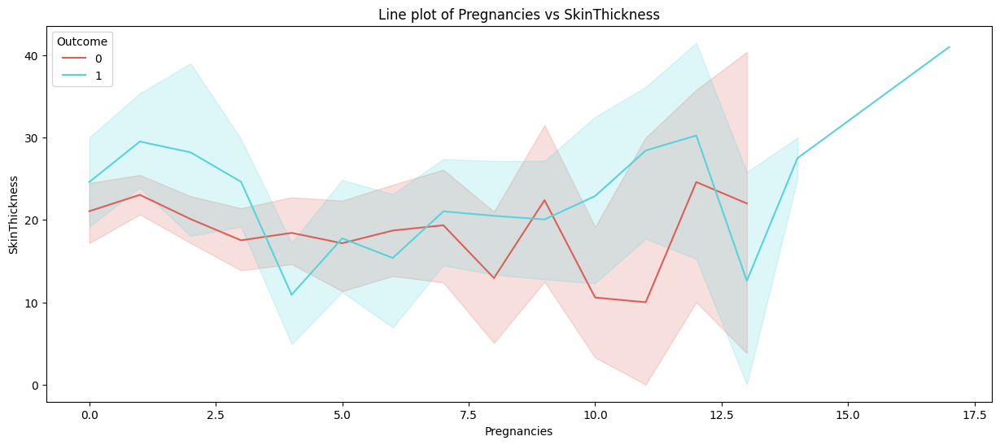

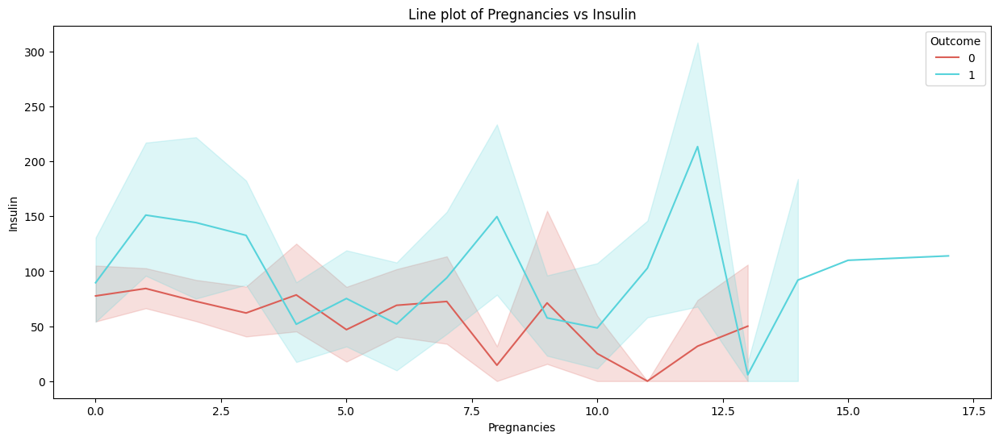

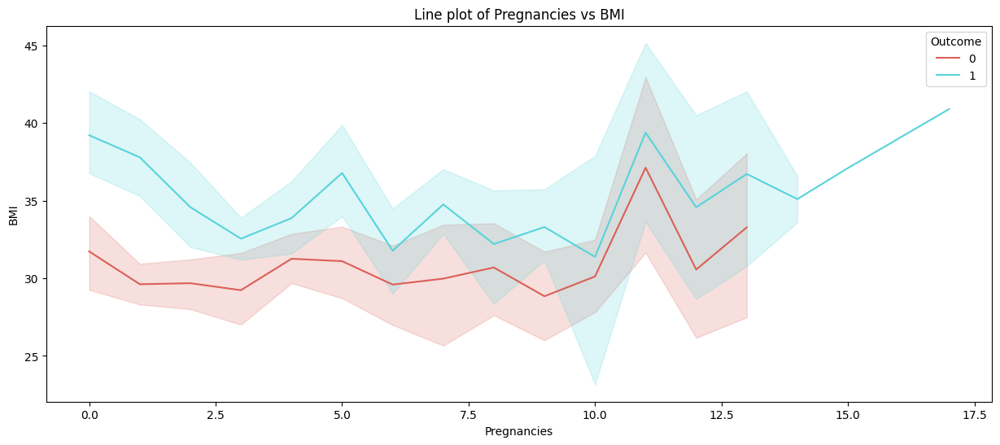

...

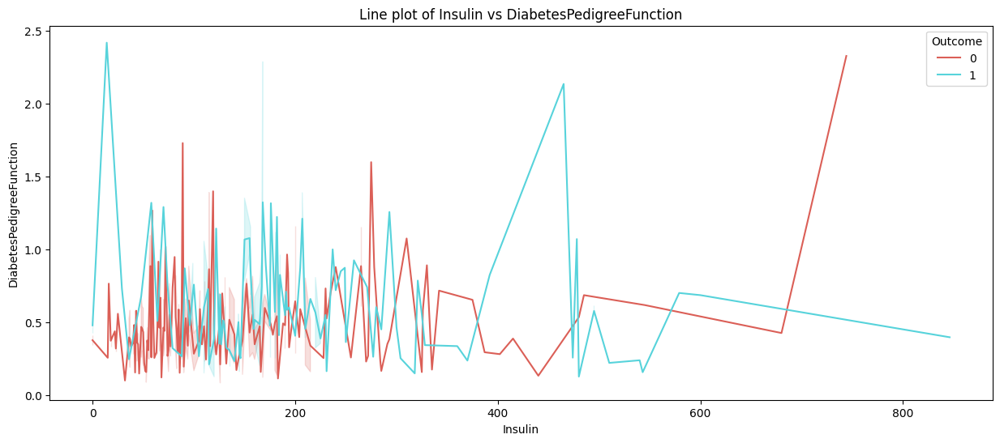

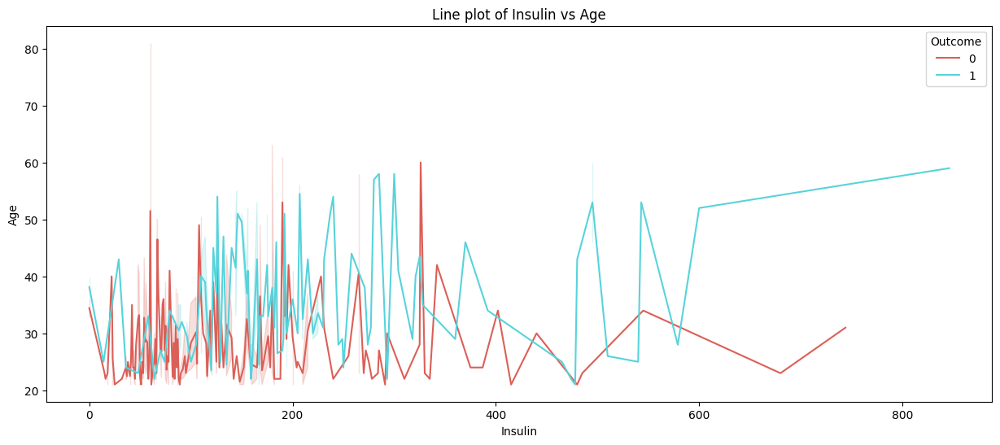

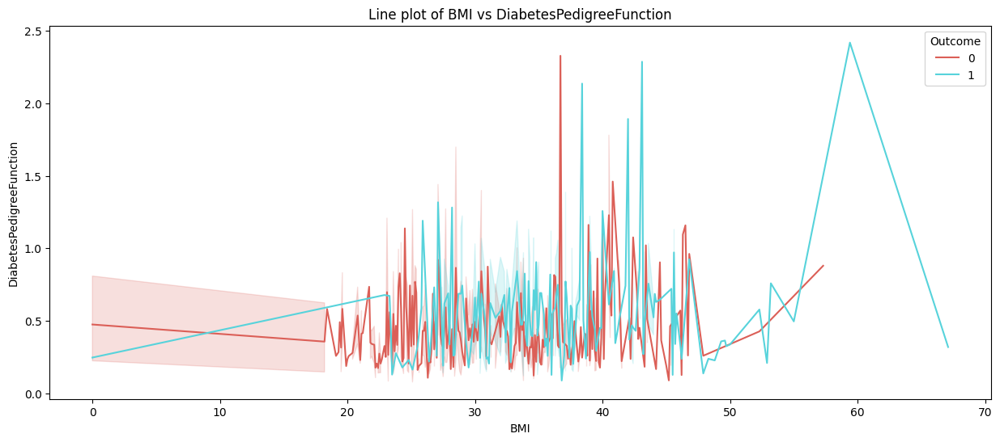

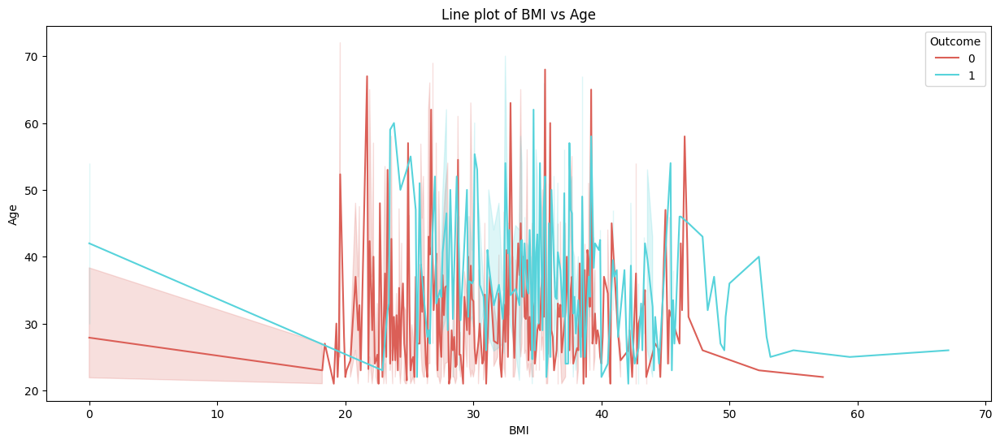

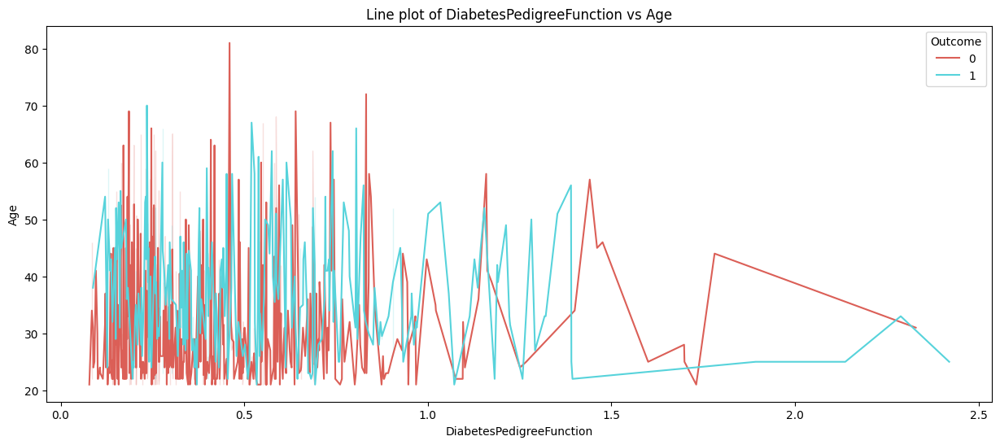

In [30]:
for i in range(len(continuous)):
    for j in range(i + 1, len(continuous)):
        plt.figure(figsize=(15, 6))
        sns.lineplot(x=continuous[i], y=continuous[j], data=df, hue='Outcome', palette='hls')
        plt.title(f'Line plot of {continuous[i]} vs {continuous[j]}')
        plt.show()


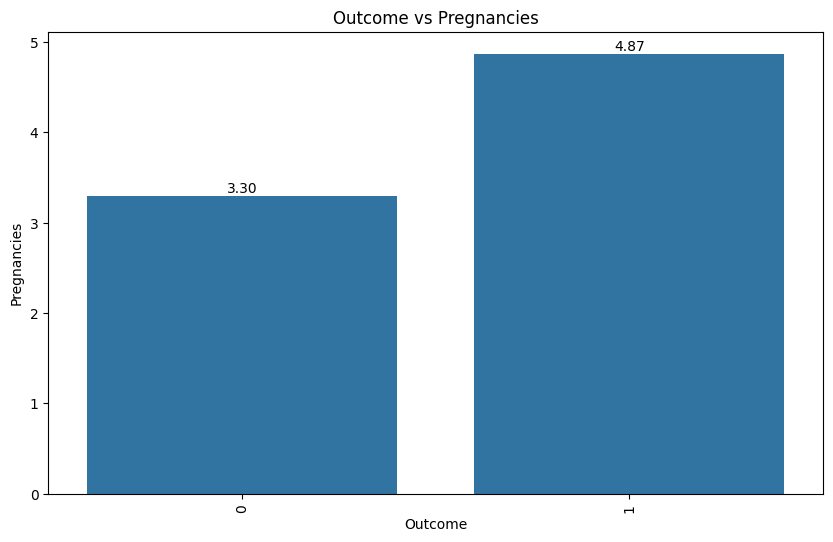

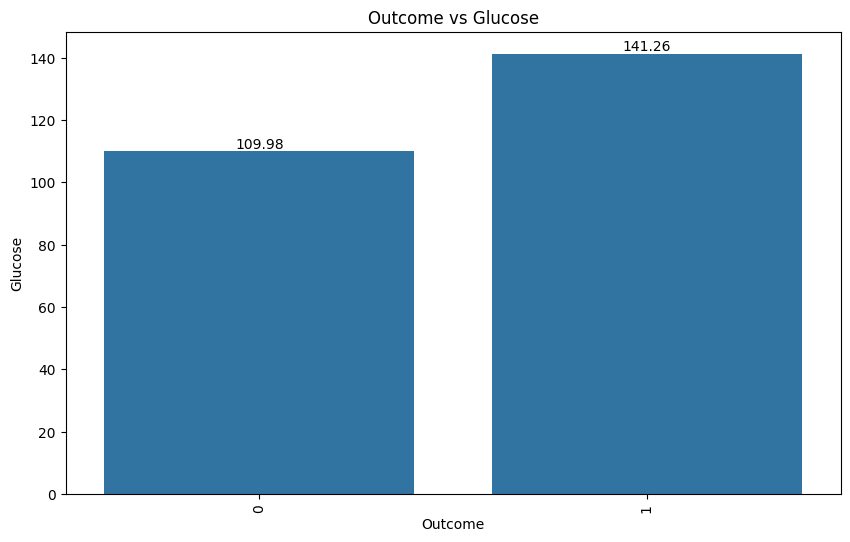

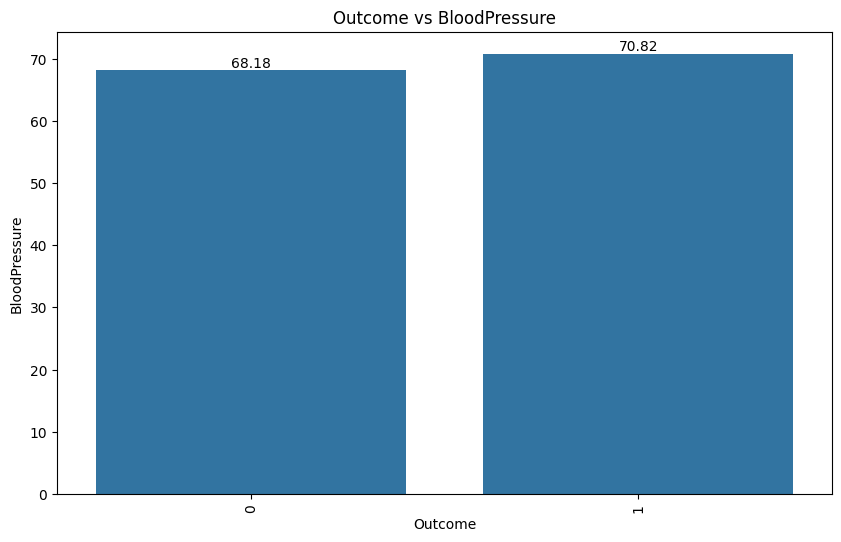

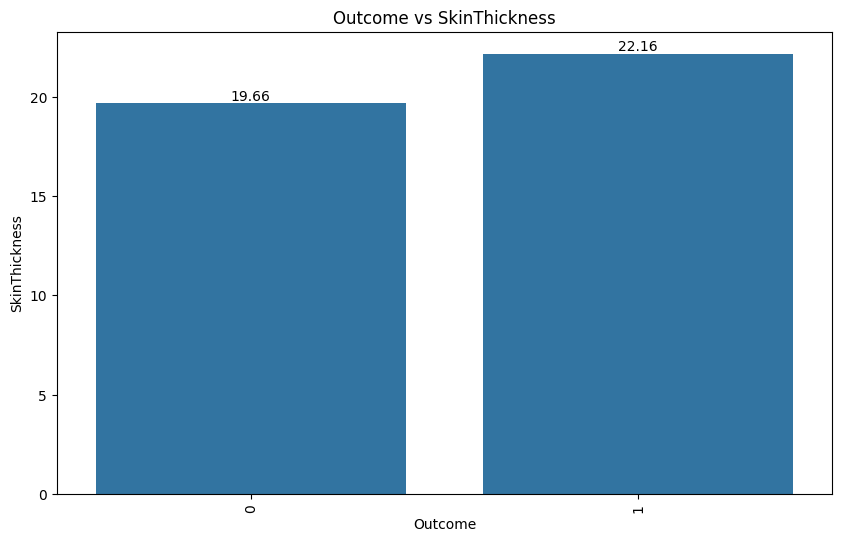

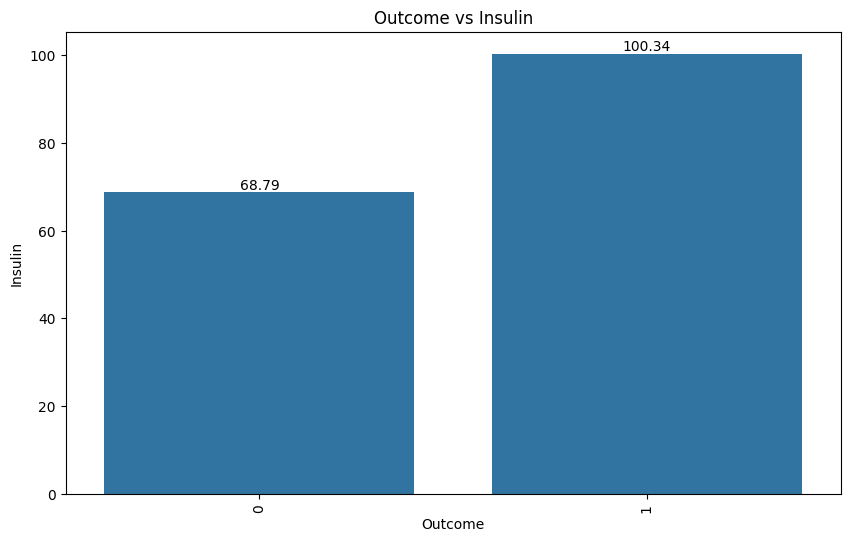

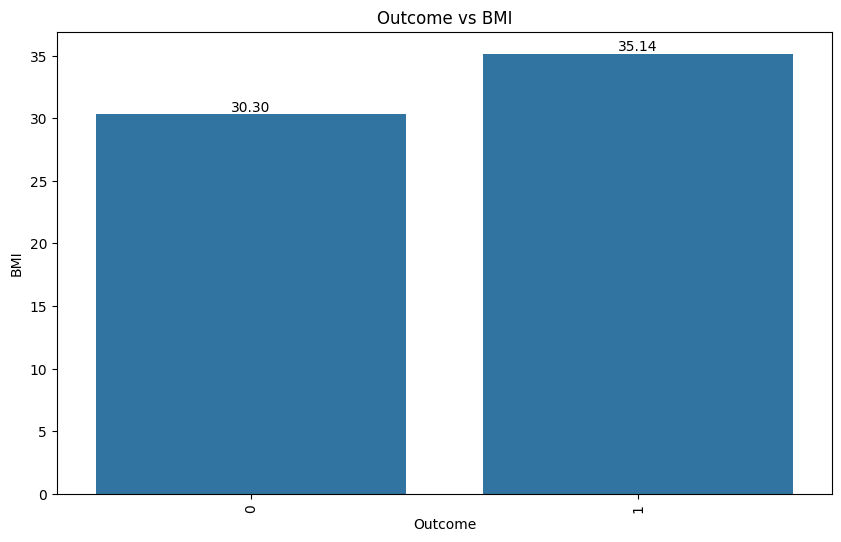

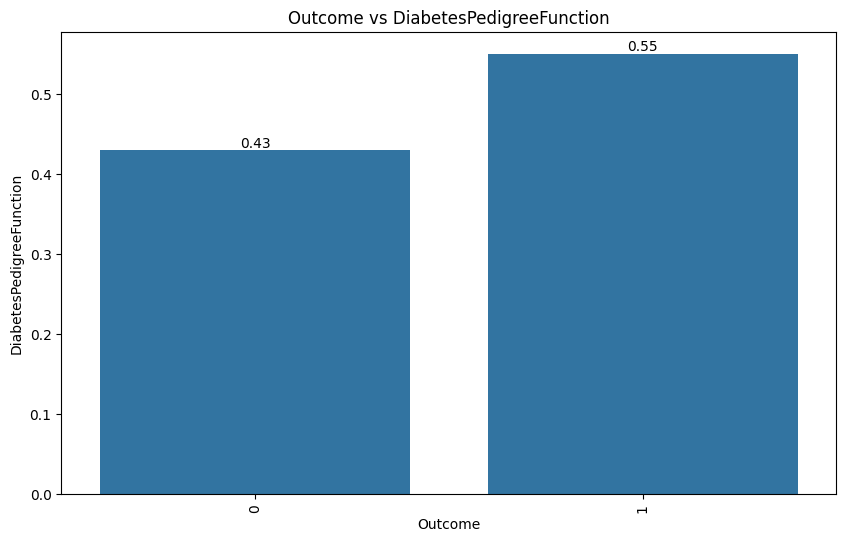

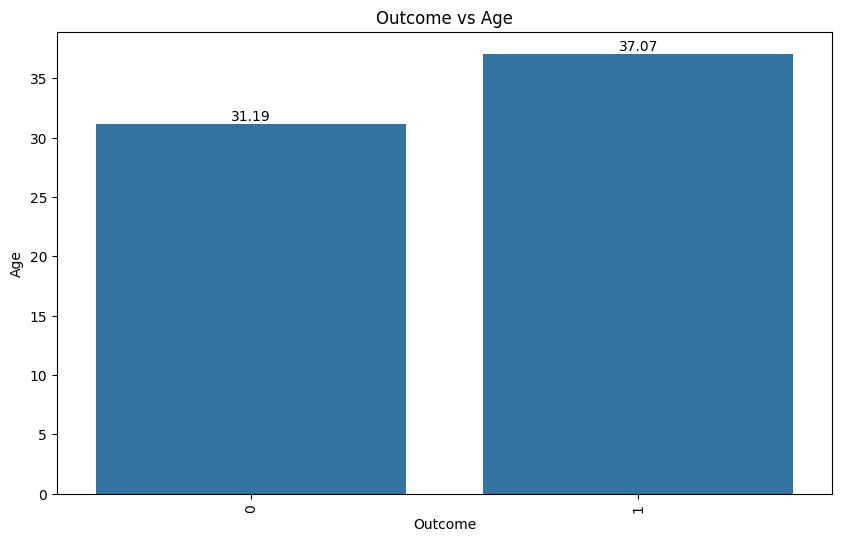

In [31]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.barplot(data=df, x=dis, y=cont, ci=None)
        plt.title(f'{dis} vs {cont}')

        for p in ax.patches:
            height = p.get_height()
            ax.annotate(
                f'{height:.2f}',
                (p.get_x() + p.get_width() / 2, height),
                ha='center',
                va='bottom',
                fontsize=10,
                color='black'
            )

        plt.xticks(rotation=90)
        plt.show()


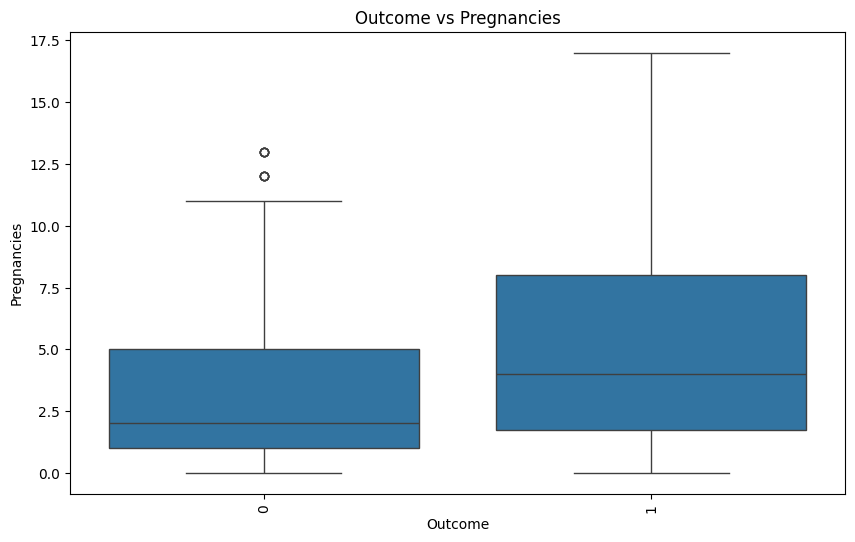

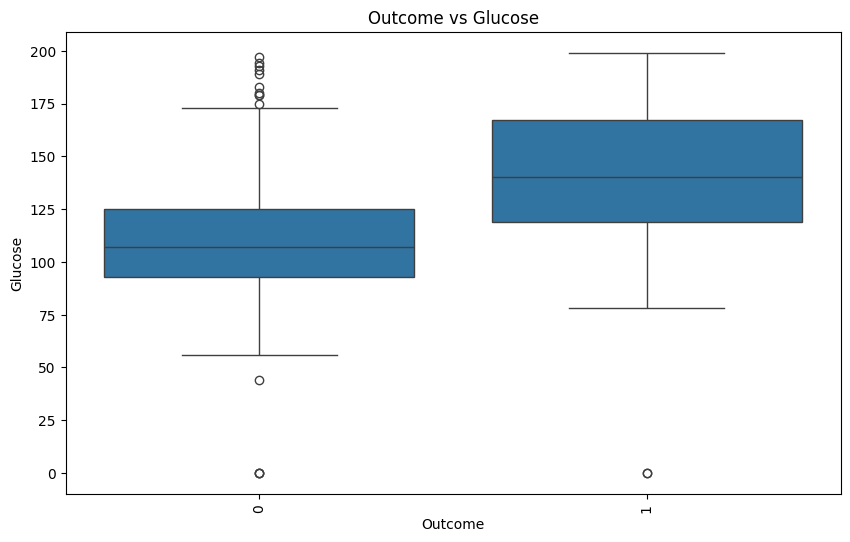

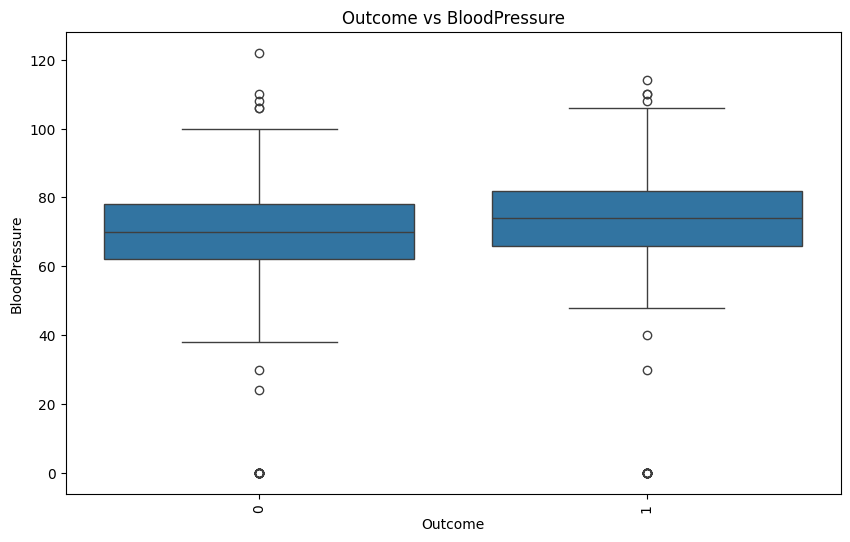

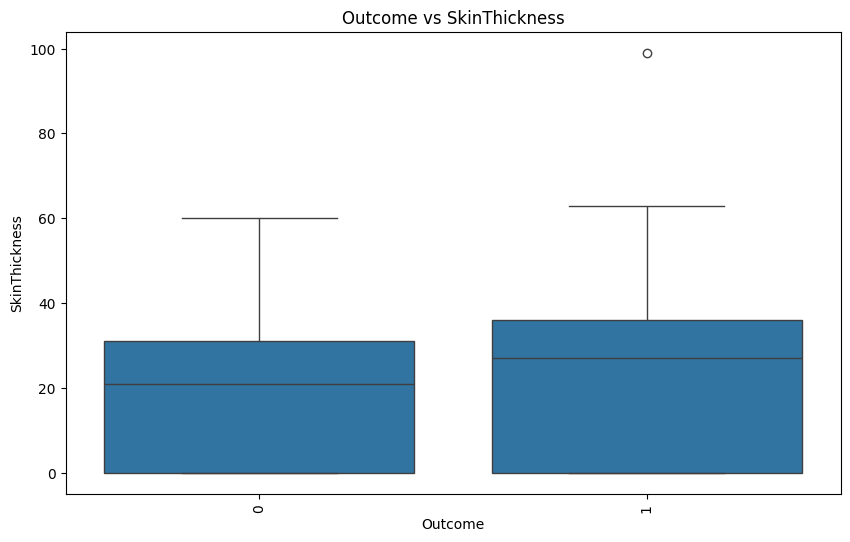

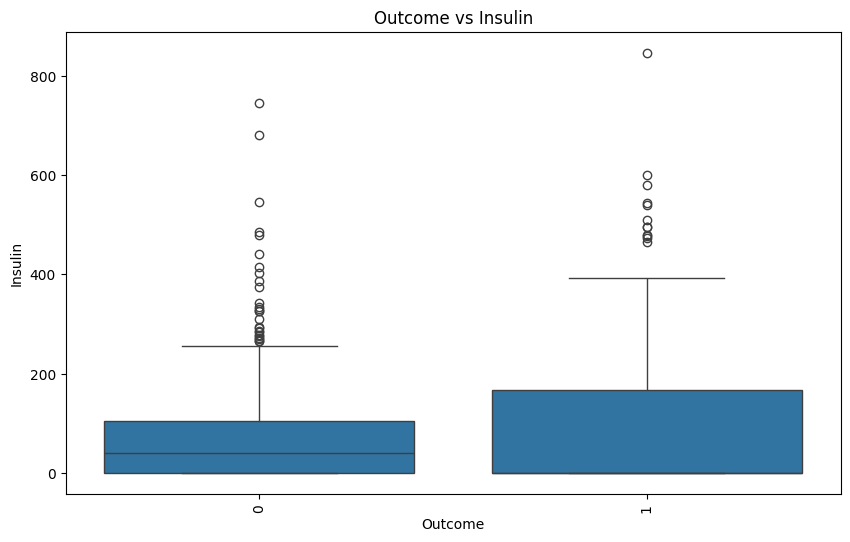

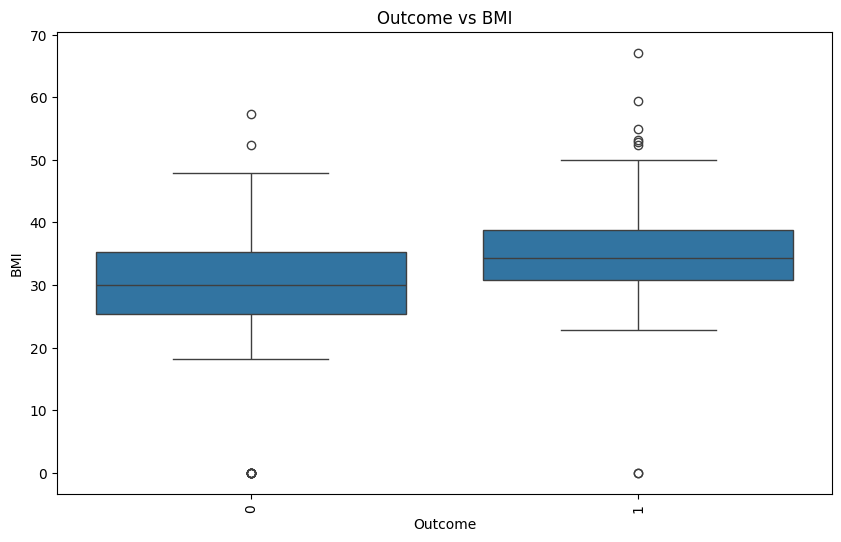

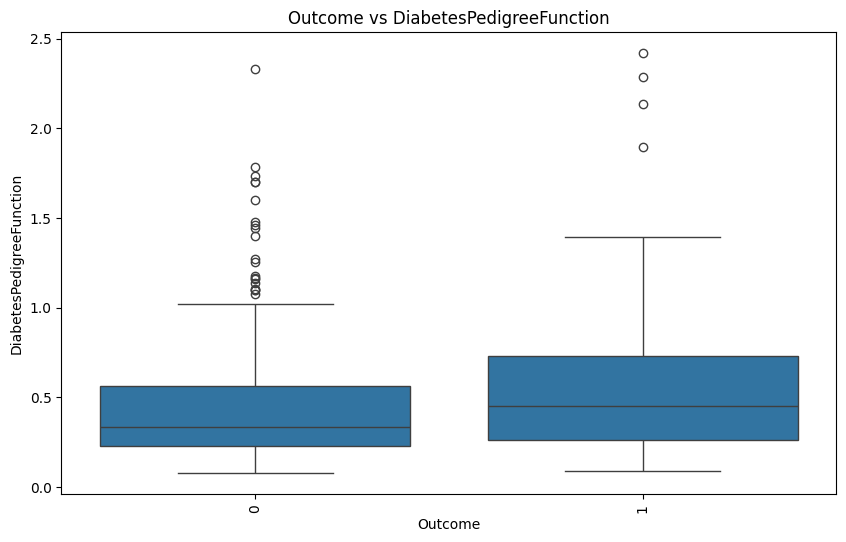

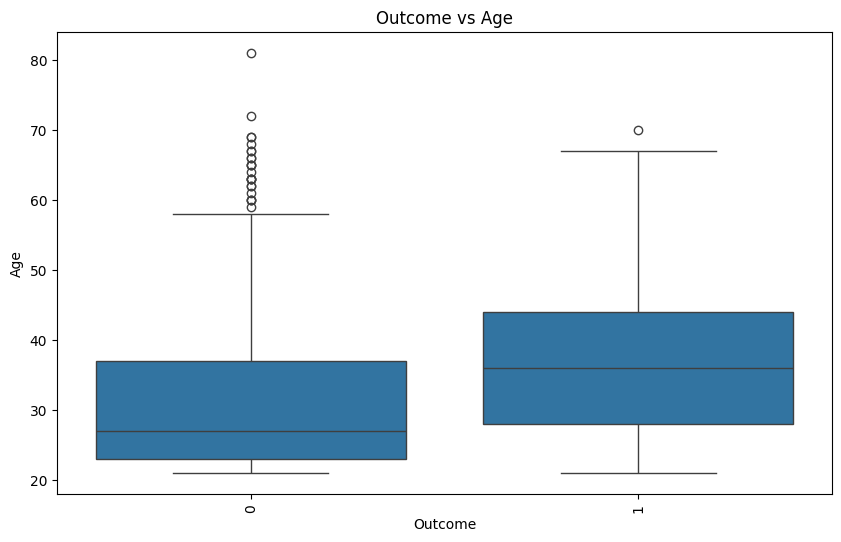

In [32]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.boxplot(data=df, x=dis, y=cont)
        plt.title(f'{dis} vs {cont}')
        plt.xticks(rotation=90)
        plt.show()


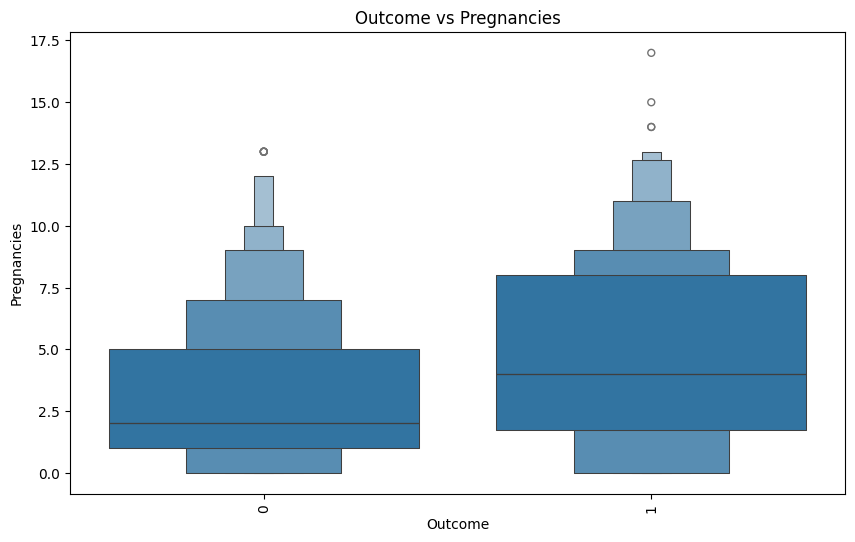

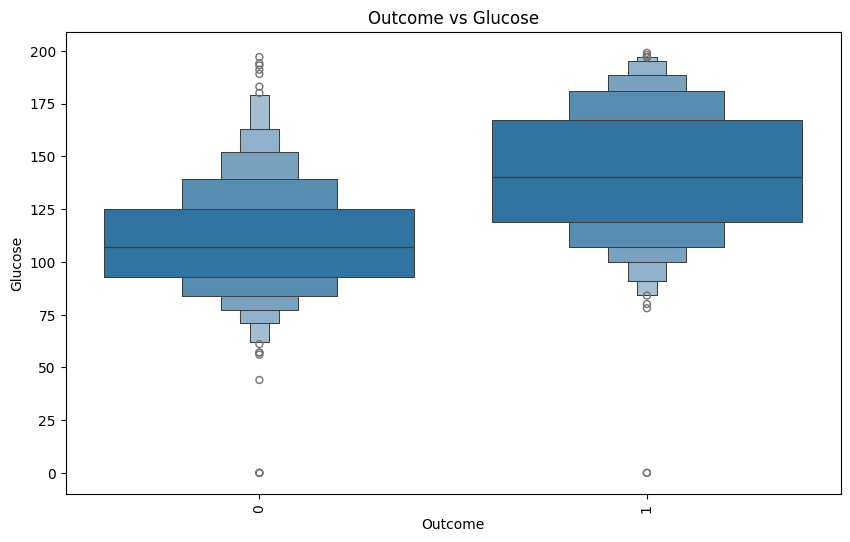

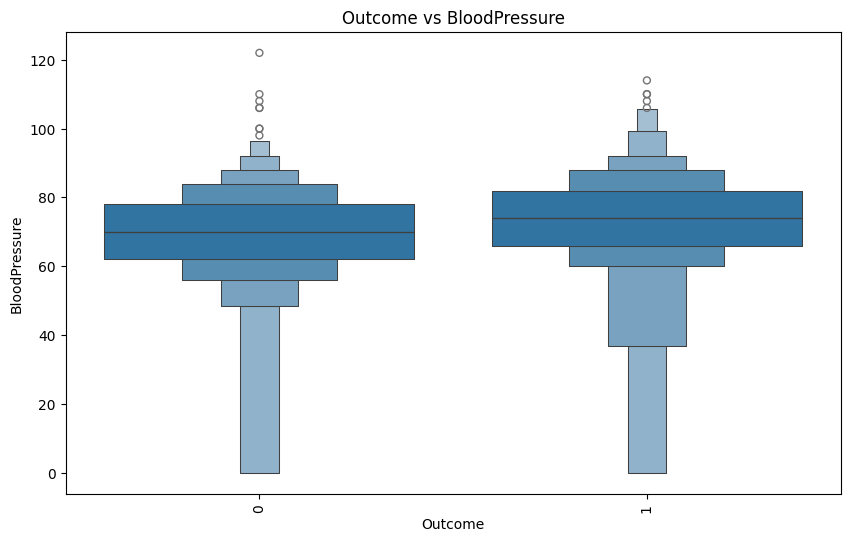

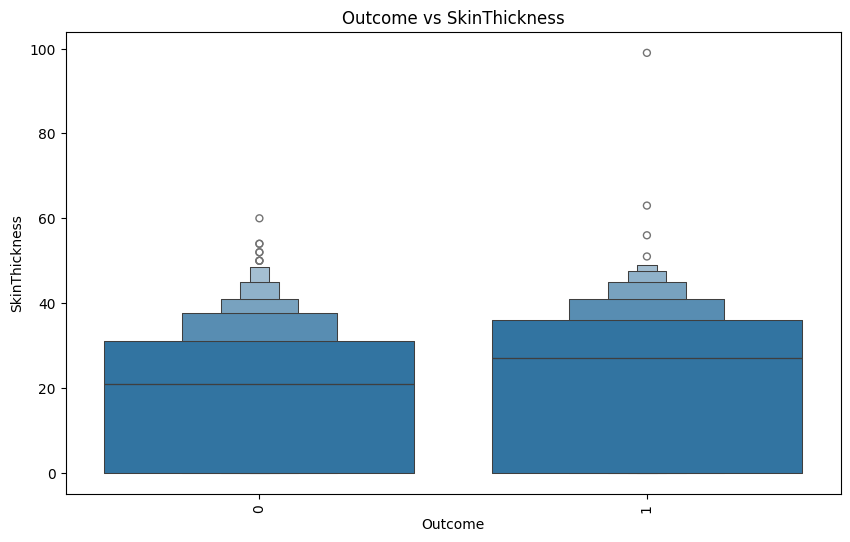

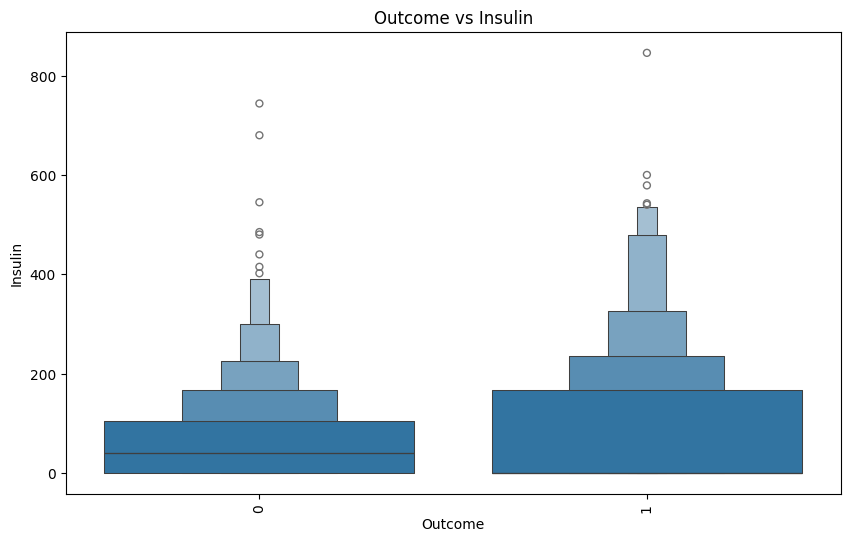

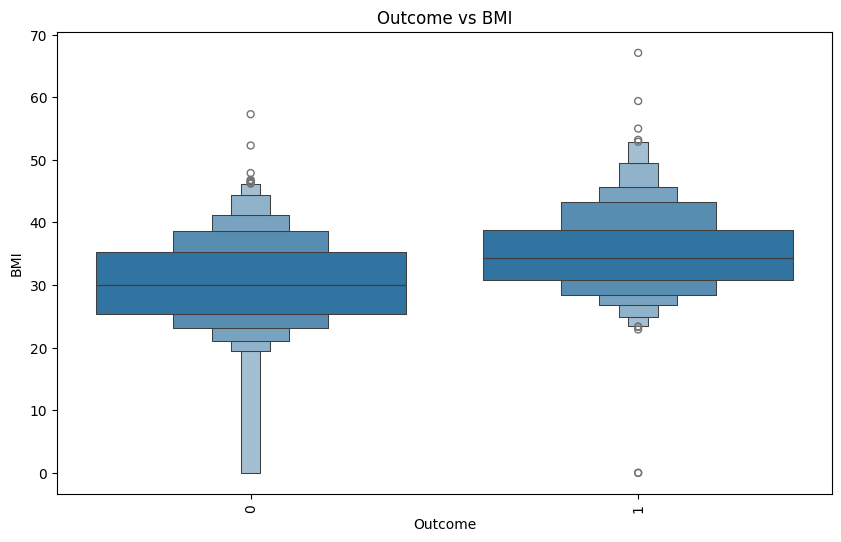

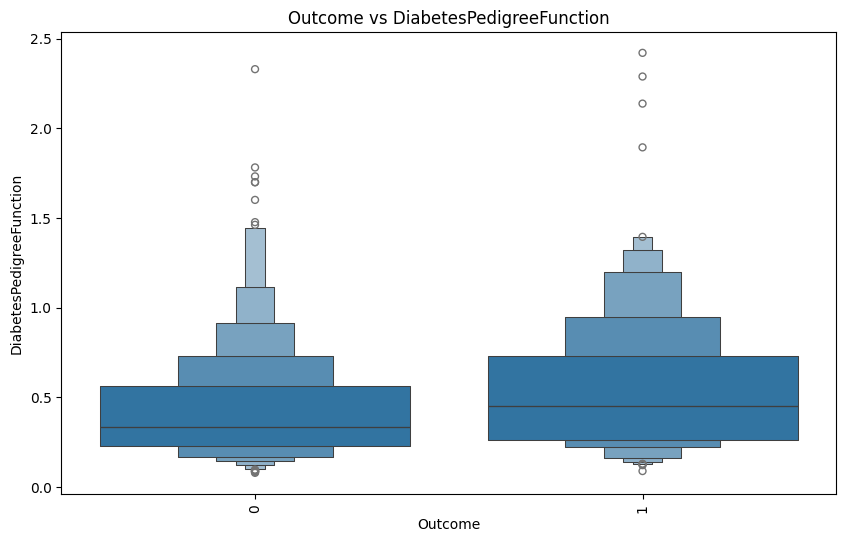

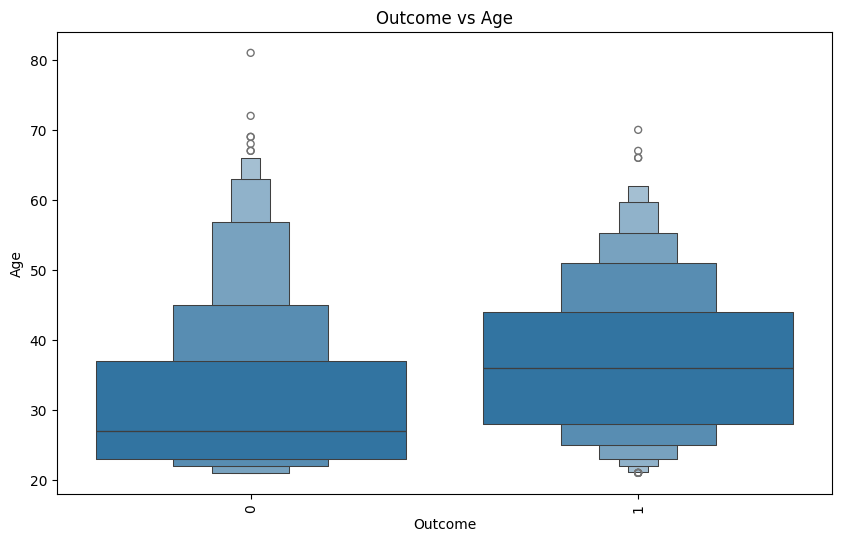

In [33]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.boxenplot(data=df, x=dis, y=cont)
        plt.title(f'{dis} vs {cont}')
        plt.xticks(rotation=90)
        plt.show()


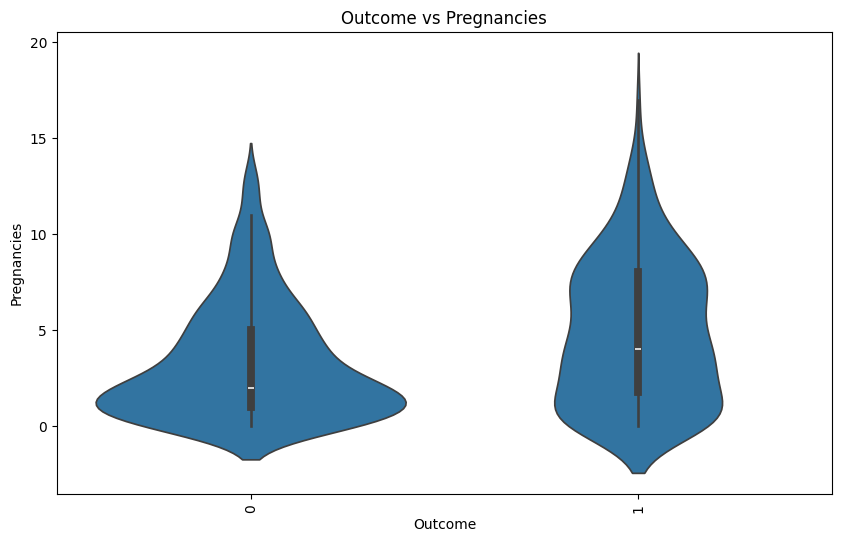

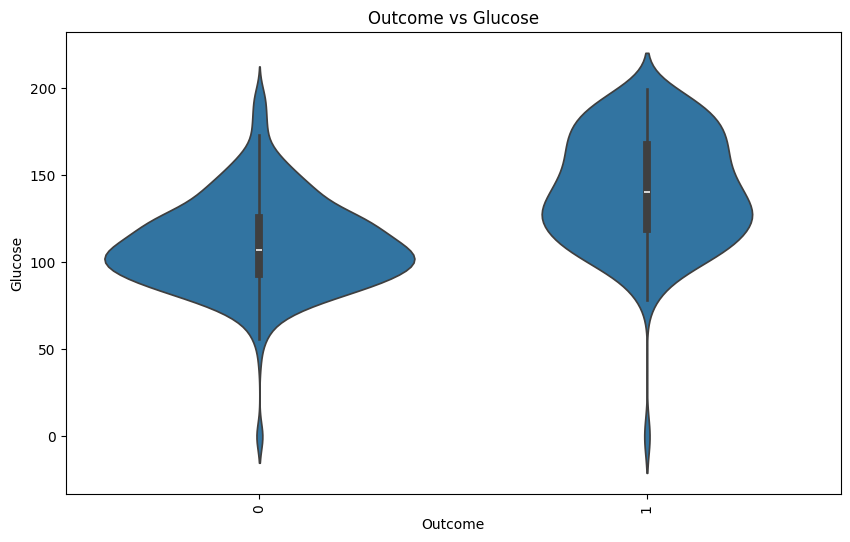

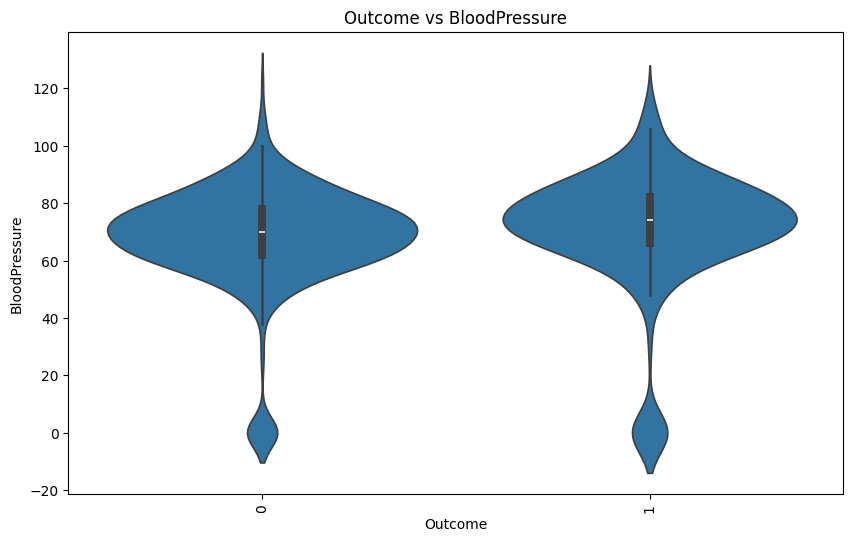

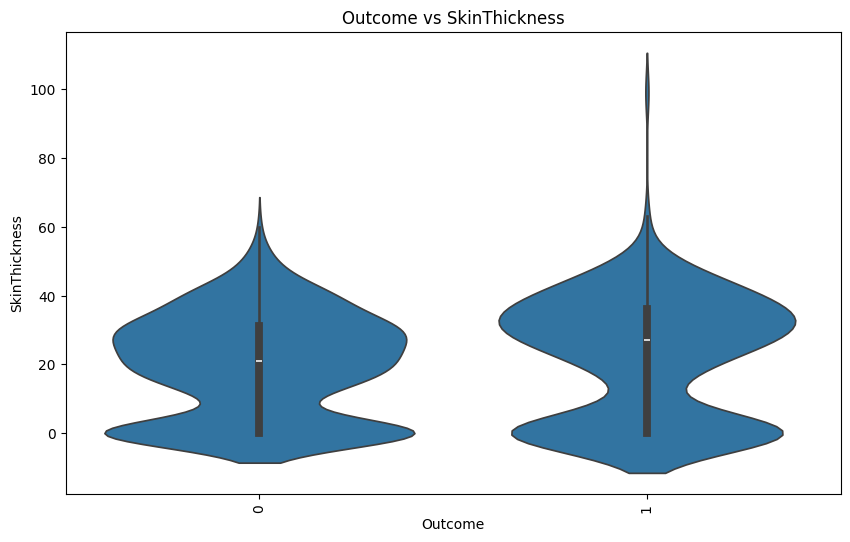

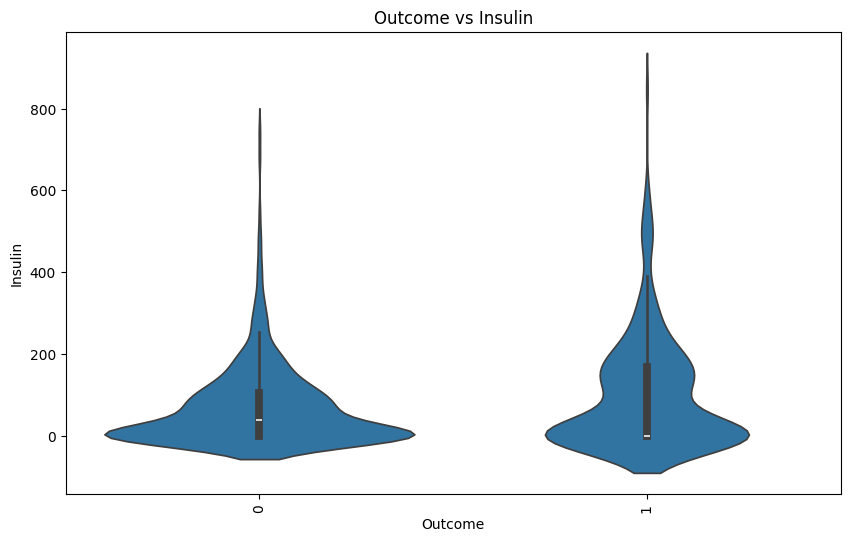

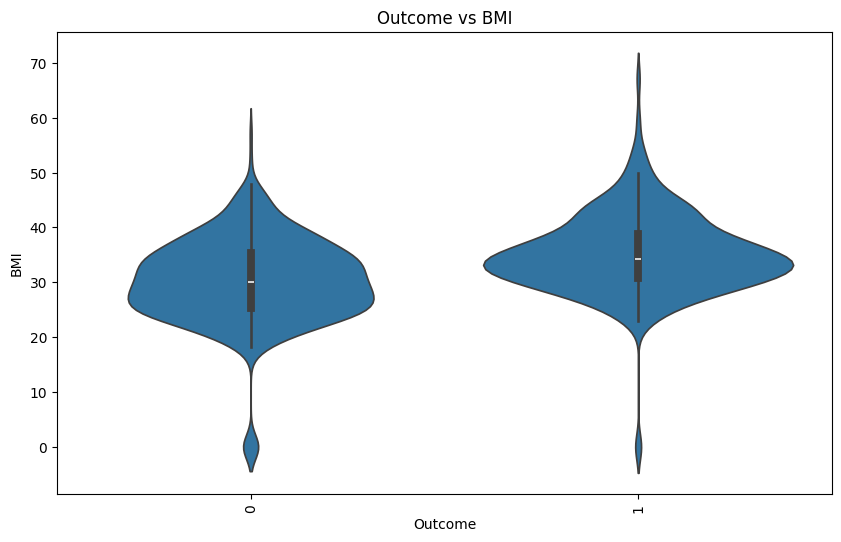

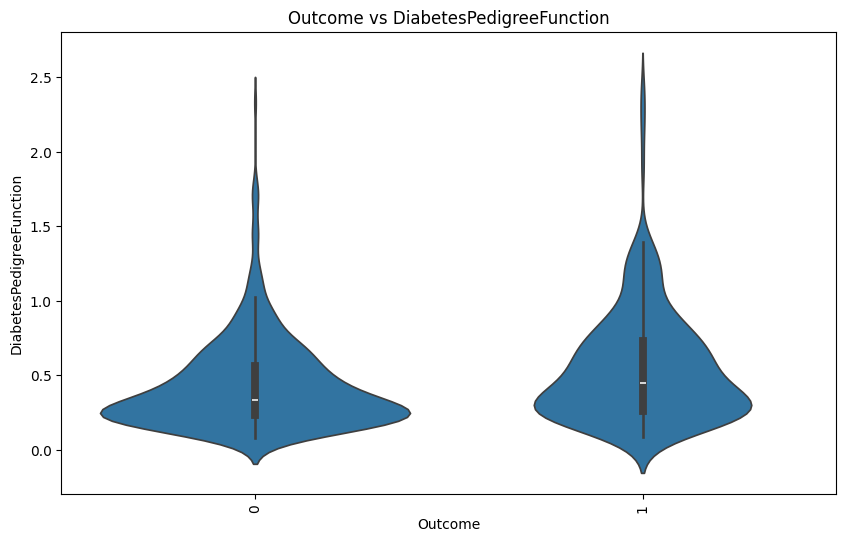

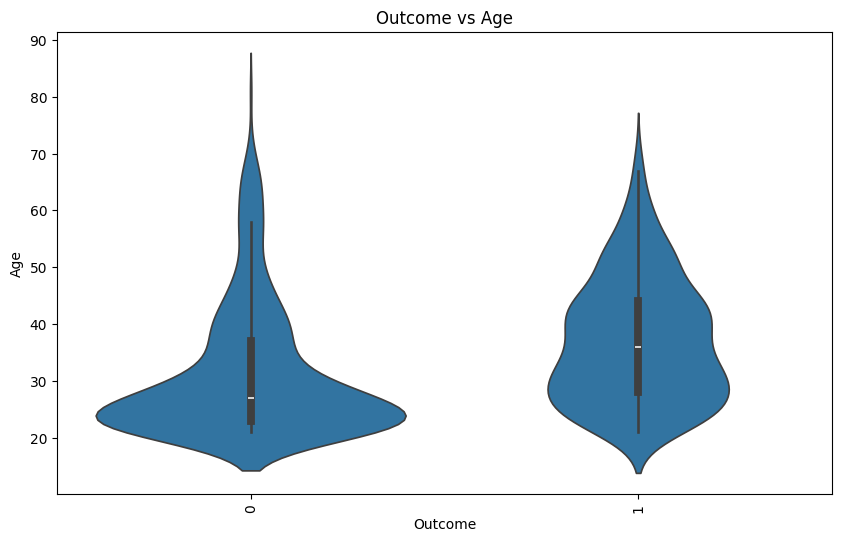

In [34]:
for dis in discrete:
    for cont in continuous:
        plt.figure(figsize=(10, 6))
        ax = sns.violinplot(data=df, x=dis, y=cont)
        plt.title(f'{dis} vs {cont}')
        plt.xticks(rotation=90)
        plt.show()


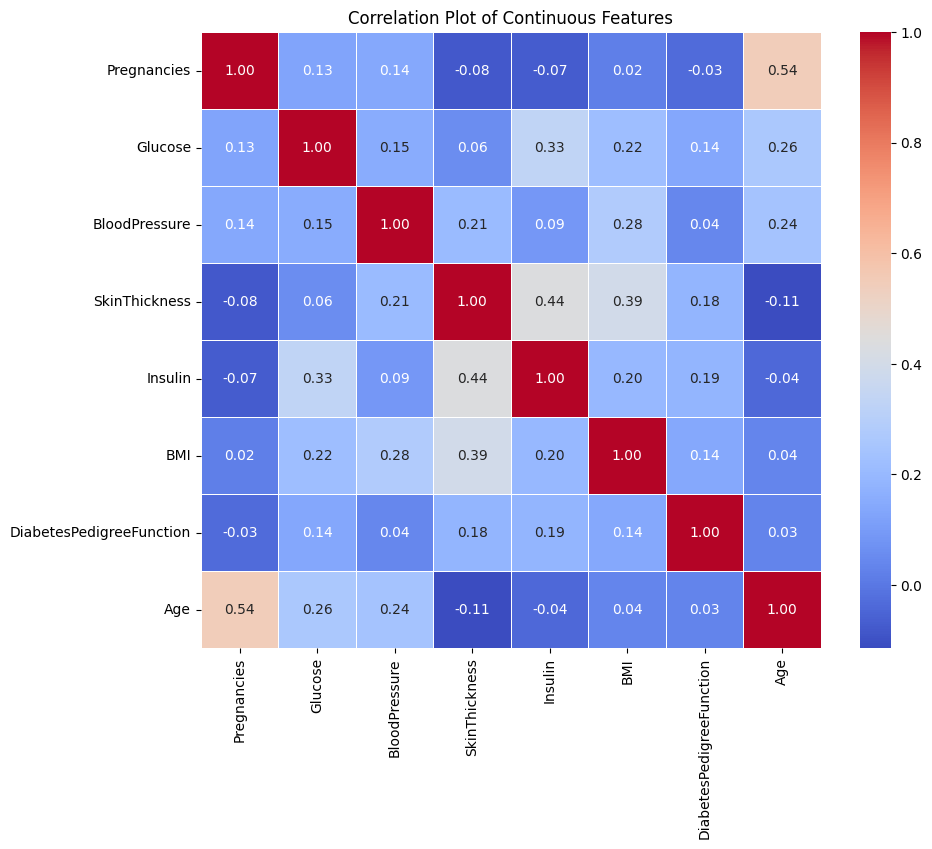

In [35]:
corr_matrix = df[continuous].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5
)
plt.title('Correlation Plot of Continuous Features')
plt.show()


In [36]:
corr_matrix

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
Pregnancies,1.000000,0.129459,0.141282,-0.081672,-0.073535,0.017683,-0.033523,0.544341
Glucose,0.129459,1.000000,0.152590,0.057328,0.331357,0.221071,0.137337,0.263514
BloodPressure,0.141282,0.152590,1.000000,0.207371,0.088933,0.281805,0.041265,0.239528
SkinThickness,-0.081672,0.057328,0.207371,1.000000,0.436783,0.392573,0.183928,-0.113970
Insulin,-0.073535,0.331357,0.088933,0.436783,1.000000,0.197859,0.185071,-0.042163
BMI,0.017683,0.221071,0.281805,0.392573,0.197859,1.000000,0.140647,0.036242
DiabetesPedigreeFunction,-0.033523,0.137337,0.041265,0.183928,0.185071,0.140647,1.000000,0.033561
Age,0.544341,0.263514,0.239528,-0.113970,-0.042163,0.036242,0.033561,1.000000


In [37]:
threshold = 0.7
features_to_drop = []

for i in range(len(corr_matrix.columns)):
    for j in range(i):
        if abs(corr_matrix.iloc[i, j]) > threshold:
            colname = corr_matrix.columns[i]
            if colname not in features_to_drop:
                features_to_drop.append(colname)

features_to_drop


[]

# **Feature Engineering**

In [38]:
def bmi_category(bmi):
    if bmi <= 18.5:
        return 'Underweight'
    elif 18.5 < bmi <= 24.9:
        return 'Healthy'
    elif 25 <= bmi <= 29.9:
        return 'Pre-obese'
    elif 30 <= bmi <= 34.9:
        return 'Obesity class 1'
    elif 35 <= bmi <= 39.9:
        return 'Obesity class 2'
    else:
        return 'Obesity class 3'

df['BMI_Category'] = df['BMI'].apply(bmi_category)

def insulin_category(insulin):
    if insulin < 25:
        return 'Fasting or 3+ hours after glucose ingestion'
    elif 30 <= insulin <= 230:
        return '30 minutes after glucose administration'
    elif 18 <= insulin <= 276:
        return '1 hour after glucose ingestion'
    elif 16 <= insulin <= 166:
        return '2 hours after glucose ingestion'
    else:
        return 'Other'

df['Insulin_Category'] = df['Insulin'].apply(insulin_category)
df


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,BMI_Category,Insulin_Category
0,6,148,72,35,0,33.6,0.627,50,1,Obesity class 1,Fasting or 3+ hours after glucose ingestion
1,1,85,66,29,0,26.6,0.351,31,0,Pre-obese,Fasting or 3+ hours after glucose ingestion
2,8,183,64,0,0,23.3,0.672,32,1,Healthy,Fasting or 3+ hours after glucose ingestion
3,1,89,66,23,94,28.1,0.167,21,0,Pre-obese,30 minutes after glucose administration
4,0,137,40,35,168,43.1,2.288,33,1,Obesity class 3,30 minutes after glucose administration
...,...,...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0,Obesity class 1,30 minutes after glucose administration
764,2,122,70,27,0,36.8,0.340,27,0,Obesity class 2,Fasting or 3+ hours after glucose ingestion
765,5,121,72,23,112,26.2,0.245,30,0,Pre-obese,30 minutes after glucose administration
766,1,126,60,0,0,30.1,0.349,47,1,Obesity class 1,Fasting or 3+ hours after glucose ingestion


In [39]:
 object_columns = df.select_dtypes(include=['object']).columns
 print("Object type columns:")
 print(object_columns)

Object type columns:
Index(['BMI_Category', 'Insulin_Category'], dtype='object')


In [42]:
numerical_columns = df.select_dtypes(include=['int64','float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)


Numerical type columns:
Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')


In [43]:
df['Outcome']

,Outcome
0,1
1,0
2,1
3,0
4,1
5,0
6,1
7,0
8,1
9,1


In [44]:
 df_new = pd.get_dummies(df, columns=['BMI_Category',
'Insulin_Category'])
 numerical_columns_1 = ['Pregnancies', 'Glucose', 'BloodPressure',
'SkinThickness', 'Insulin','BMI', 'DiabetesPedigreeFunction', 'Age']
 pivot_table = pd.pivot_table(df_new, values='Glucose',
index='Outcome', aggfunc='mean')
 pivot_table

,Glucose
Outcome,
0,109.980000
1,141.257463


In [45]:
 pivot_table = pd.pivot_table(df_new, values=['Glucose',
'BloodPressure', 'Insulin','BMI', 'Age'], index=['Outcome'],
aggfunc=['mean', 'max'])
 pivot_table

mean                                                  max        \
               Age        BMI BloodPressure     Glucose     Insulin Age   BMI   
Outcome                                                                         
0        31.190000  30.304200     68.184000  109.980000   68.792000  81  57.3   
1        37.067164  35.142537     70.824627  141.257463  100.335821  70  67.1   

                                       
        BloodPressure Glucose Insulin  
Outcome                                
0                 122     197     744  
1                 114     199     846

# **Modeling**

In [48]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df_new[numerical_columns_1] = scaler.fit_transform(df_new[numerical_columns_1])

X = df_new.drop(['Outcome'], axis=1)
y = df_new['Outcome']

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=42, test_size=0.20)

from imblearn.over_sampling import SMOTE

sm = SMOTE()
X_train, y_train = sm.fit_resample(X_train, y_train)

from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))


Accuracy: 0.75
Precision: 0.62
Recall: 0.74
F1-score: 0.67


In [49]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


Confusion matrix:
[[75 25]
 [14 40]]


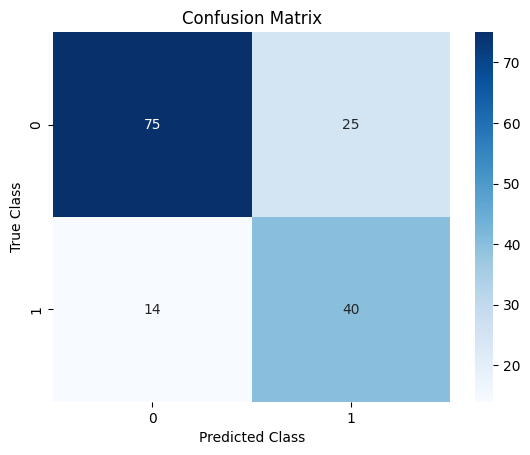

In [50]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()


In [51]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.84      0.75      0.79       100
           1       0.62      0.74      0.67        54

    accuracy                           0.75       154
   macro avg       0.73      0.75      0.73       154
weighted avg       0.76      0.75      0.75       154



In [52]:
from sklearn.tree import DecisionTreeClassifier

clf = DecisionTreeClassifier()
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))


Accuracy: 0.66
Precision: 0.52
Recall: 0.54
F1-score: 0.53


In [53]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


Confusion matrix:
[[73 27]
 [25 29]]


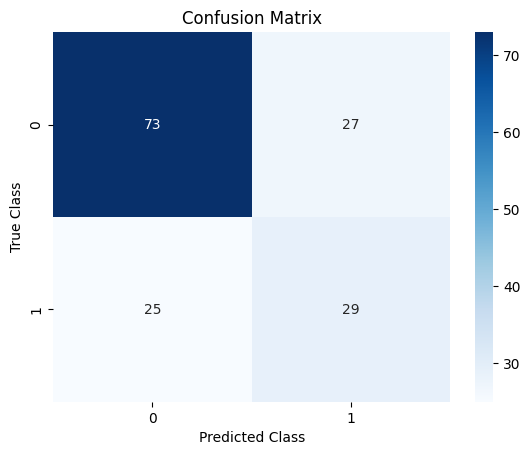

In [54]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()


In [55]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.74      0.73      0.74       100
           1       0.52      0.54      0.53        54

    accuracy                           0.66       154
   macro avg       0.63      0.63      0.63       154
weighted avg       0.67      0.66      0.66       154



In [56]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))


Accuracy: 0.74
Precision: 0.62
Recall: 0.67
F1-score: 0.64


In [57]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


Confusion matrix:
[[78 22]
 [18 36]]


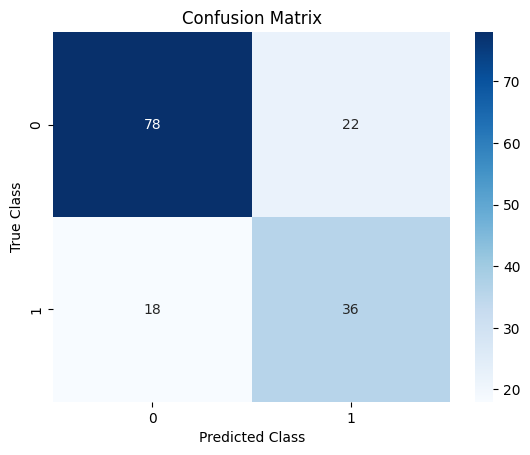

In [58]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()


In [59]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.81      0.78      0.80       100
           1       0.62      0.67      0.64        54

    accuracy                           0.74       154
   macro avg       0.72      0.72      0.72       154
weighted avg       0.75      0.74      0.74       154



In [60]:
from sklearn.svm import SVC

sv = SVC(kernel='linear')
sv.fit(X_train, y_train)

y_pred = sv.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))


Accuracy: 0.73
Precision: 0.62
Recall: 0.63
F1-score: 0.62


In [61]:
cm = confusion_matrix(y_test, y_pred)
print("Confusion matrix:")
print(cm)


Confusion matrix:
[[79 21]
 [20 34]]


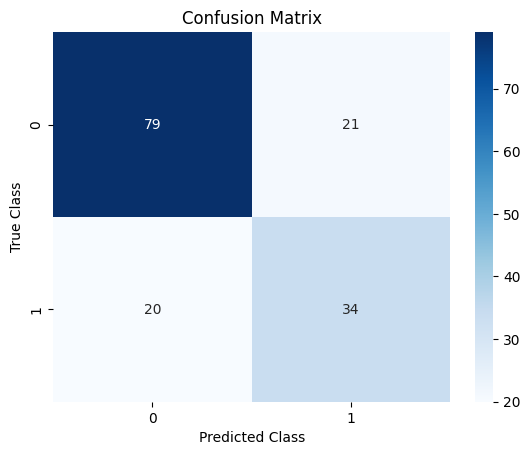

In [62]:
sns.heatmap(cm, annot=True, cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")
plt.show()


In [63]:
report = classification_report(y_test, y_pred)
print("Classification report:")
print(report)


Classification report:
              precision    recall  f1-score   support

           0       0.80      0.79      0.79       100
           1       0.62      0.63      0.62        54

    accuracy                           0.73       154
   macro avg       0.71      0.71      0.71       154
weighted avg       0.73      0.73      0.73       154



In [64]:
from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier()
gbc.fit(X_train, y_train)

y_pred = gbc.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print("Accuracy: {:.2f}".format(accuracy))
print("Precision: {:.2f}".format(precision))
print("Recall: {:.2f}".format(recall))
print("F1-score: {:.2f}".format(f1))


Accuracy: 0.77
Precision: 0.65
Recall: 0.78
F1-score: 0.71


In Python, pickle is a module used for serializing and deserializing Python objects.

In [65]:
import pickle

model_filename = 'svm_model_diabetes.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(sv, file)

print(f"Model saved to {model_filename}")


Model saved to svm_model_diabetes.pkl
